<a href="https://colab.research.google.com/github/AmyMorrison2/asthma-air-pollution-capstone/blob/main/Revised_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **EDA**


## Data Import and Prep

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
import zipfile
import os


In [ ]:

asthma_df = pd.read_csv("crude_asthma_2011_2021.csv", dtype={"CountyFIPS": str, "StateFIPS": str})
pollution_df = pd.read_csv("cleaned_data_2011_2021.csv", dtype={"FIPS": str, "State Code": str, "County Code": str})


In [ ]:
asthma_df.head()

,StateFIPS,State,CountyFIPS,County,Year,Value,Data Comment,Unnamed: 7
0,04,Arizona,04001,Apache,2011,42.0,NaN,NaN
1,04,Arizona,04001,Apache,2012,41.0,NaN,NaN
2,04,Arizona,04001,Apache,2013,39.3,NaN,NaN
3,04,Arizona,04001,Apache,2014,38.5,NaN,NaN
4,04,Arizona,04001,Apache,2015,39.0,NaN,NaN


In [ ]:
asthma_df.shape



(15464, 8)

In [ ]:
asthma_df.describe()

,Year,Value,Data Comment,Unnamed: 7
count,15464.000000,15464.000000,0.0,0.0
mean,2016.319193,35.368081,NaN,NaN
std,3.125999,17.352944,NaN,NaN
min,2011.000000,2.100000,NaN,NaN
25%,2014.000000,22.675000,NaN,NaN
50%,2017.000000,32.100000,NaN,NaN
75%,2019.000000,45.400000,NaN,NaN
max,2021.000000,136.000000,NaN,NaN


In [ ]:
pollution_df.head()

,State Code,County Code,Arithmetic Mean,Parameter Name,Latitude,Longitude,Units of Measure,Observation Count,FIPS,Year
0,1,3,0.050682,Ozone,30.497478,-87.880258,Parts per million,5609,01003,2011
1,1,3,0.045416,Ozone,30.497478,-87.880258,Parts per million,5864,01003,2011
2,1,3,0.045416,Ozone,30.497478,-87.880258,Parts per million,5864,01003,2011
3,1,3,0.045372,Ozone,30.497478,-87.880258,Parts per million,4149,01003,2011
4,1,3,9.953913,PM2.5 - Local Conditions,30.497478,-87.880258,Micrograms/cubic meter (LC),115,01003,2011


In [ ]:
pollution_df.shape

(226136, 10)

In [ ]:
pollution_df.describe()

,Arithmetic Mean,Latitude,Longitude,Observation Count,Year
count,226136.000000,226136.000000,226136.000000,226136.000000,226136.000000
mean,6.230144,38.456091,-95.710855,2585.153209,2016.323283
std,4.922269,5.777930,18.106021,3373.832601,3.132590
min,-1.056180,17.712474,-159.366240,1.000000,2011.000000
25%,0.052405,35.017080,-111.752943,117.000000,2014.000000
50%,7.153535,39.214870,-90.344494,349.000000,2016.000000
75%,9.087411,41.696660,-81.621161,5832.000000,2019.000000
max,57.696078,64.845930,-64.784868,8784.000000,2021.000000


In [ ]:
pollution_wide = pollution_df.pivot_table(
    index=["FIPS", "Year"],
    columns="Parameter Name",
    values="Arithmetic Mean",
    aggfunc="mean"
).reset_index()

pollution_wide.head()

Parameter Name,FIPS,Year,Nitrogen dioxide (NO2),Ozone,PM2.5 - Local Conditions
0,01003,2011,NaN,0.046721,9.953913
1,01003,2012,NaN,0.043391,9.200826
2,01003,2013,NaN,0.040323,8.383784
3,01003,2014,NaN,0.041925,8.906838
4,01003,2015,NaN,0.040848,8.631579


In [ ]:
pollution_wide.describe()

Parameter Name,Year,Nitrogen dioxide (NO2),Ozone,PM2.5 - Local Conditions
count,10165.000000,2791.000000,8661.000000,6716.000000
mean,2015.975307,11.413913,0.043189,8.033909
std,3.162508,6.406433,0.005247,2.243431
min,2011.000000,0.000000,0.006505,0.916681
25%,2013.000000,6.212919,0.040102,6.731205
50%,2016.000000,11.090623,0.043190,8.001284
75%,2019.000000,15.678390,0.046170,9.200989
max,2021.000000,36.922793,0.068303,32.217070


In [ ]:
merged_df = pd.merge(
    asthma_df,
    pollution_wide,
    left_on=["CountyFIPS", "Year"],
    right_on=["FIPS", "Year"],
    how="inner"
)

merged_df = merged_df.drop(columns=["Data Comment", "Unnamed: 7"], errors="ignore")
merged_df.head()

,StateFIPS,State,CountyFIPS,County,Year,Value,FIPS,Nitrogen dioxide (NO2),Ozone,PM2.5 - Local Conditions
0,04,Arizona,04001,Apache,2011,42.0,04001,NaN,NaN,3.286895
1,04,Arizona,04001,Apache,2012,41.0,04001,NaN,NaN,2.821349
2,04,Arizona,04001,Apache,2014,38.5,04001,NaN,NaN,3.022157
3,04,Arizona,04001,Apache,2015,39.0,04001,NaN,NaN,2.739584
4,04,Arizona,04001,Apache,2016,38.2,04001,NaN,NaN,2.383333


In [ ]:
demo_df = pd.read_csv("analytic_data2021.csv", dtype={"5-digit FIPS Code": str})

demo_cols = [
    "5-digit FIPS Code",
    "Population raw value",
    "% below 18 years of age raw value",
    "% 65 and older raw value",
    "% Non-Hispanic Black raw value",
    "% Hispanic raw value",
    "% Non-Hispanic White raw value",
    "Median household income raw value",
    "Children in poverty raw value",
    "Some college raw value"
]

demo_df = demo_df[demo_cols]

merged_df = pd.merge(
    merged_df,
    demo_df,
    left_on="CountyFIPS",
    right_on="5-digit FIPS Code",
    how="left"
)

merged_df.head()

/tmp/ipython-input-2059347950.py:1: DtypeWarning: Columns (0,1,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,2

,StateFIPS,State,CountyFIPS,County,Year,Value,FIPS,Nitrogen dioxide (NO2),Ozone,PM2.5 - Local Conditions,5-digit FIPS Code,Population raw value,% below 18 years of age raw value,% 65 and older raw value,% Non-Hispanic Black raw value,% Hispanic raw value,% Non-Hispanic White raw value,Median household income raw value,Children in poverty raw value,Some college raw value
0,04,Arizona,04001,Apache,2011,42.0,04001,NaN,NaN,3.286895,04001,71887,0.2702157553,0.1576641117,0.0049522167,0.0658811746,0.179935176,35386,0.447,0.5113643072
1,04,Arizona,04001,Apache,2012,41.0,04001,NaN,NaN,2.821349,04001,71887,0.2702157553,0.1576641117,0.0049522167,0.0658811746,0.179935176,35386,0.447,0.5113643072
2,04,Arizona,04001,Apache,2014,38.5,04001,NaN,NaN,3.022157,04001,71887,0.2702157553,0.1576641117,0.0049522167,0.0658811746,0.179935176,35386,0.447,0.5113643072
3,04,Arizona,04001,Apache,2015,39.0,04001,NaN,NaN,2.739584,04001,71887,0.2702157553,0.1576641117,0.0049522167,0.0658811746,0.179935176,35386,0.447,0.5113643072
4,04,Arizona,04001,Apache,2016,38.2,04001,NaN,NaN,2.383333,04001,71887,0.2702157553,0.1576641117,0.0049522167,0.0658811746,0.179935176,35386,0.447,0.5113643072


In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5201 entries, 0 to 5200
Data columns (total 20 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   StateFIPS                          5201 non-null   object 
 1   State                              5201 non-null   object 
 2   CountyFIPS                         5201 non-null   object 
 3   County                             5201 non-null   object 
 4   Year                               5201 non-null   int64  
 5   Value                              5201 non-null   float64
 6   FIPS                               5201 non-null   object 
 7   Nitrogen dioxide (NO2)             1604 non-null   float64
 8   Ozone                              4691 non-null   float64
 9   PM2.5 - Local Conditions           3432 non-null   float64
 10  5-digit FIPS Code                  5201 non-null   object 
 11  Population raw value               5201 non-null   objec

In [ ]:
numeric_cols = [
    "Population raw value",
    "% below 18 years of age raw value",
    "% 65 and older raw value",
    "% Non-Hispanic Black raw value",
    "% Hispanic raw value",
    "% Non-Hispanic White raw value",
    "Median household income raw value",
    "Children in poverty raw value",
    "Some college raw value"
]

for col in numeric_cols:
    merged_df[col] = pd.to_numeric(merged_df[col], errors="coerce")

merged_df = merged_df.drop(columns=["5-digit FIPS Code"])
merged_df = merged_df.rename(columns={"Value": "Asthma Rate"})

In [ ]:
merged_df.head()

,StateFIPS,State,CountyFIPS,County,Year,Asthma Rate,FIPS,Nitrogen dioxide (NO2),Ozone,PM2.5 - Local Conditions,Population raw value,% below 18 years of age raw value,% 65 and older raw value,% Non-Hispanic Black raw value,% Hispanic raw value,% Non-Hispanic White raw value,Median household income raw value,Children in poverty raw value,Some college raw value
0,04,Arizona,04001,Apache,2011,42.0,04001,NaN,NaN,3.286895,71887,0.270216,0.157664,0.004952,0.065881,0.179935,35386,0.447,0.511364
1,04,Arizona,04001,Apache,2012,41.0,04001,NaN,NaN,2.821349,71887,0.270216,0.157664,0.004952,0.065881,0.179935,35386,0.447,0.511364
2,04,Arizona,04001,Apache,2014,38.5,04001,NaN,NaN,3.022157,71887,0.270216,0.157664,0.004952,0.065881,0.179935,35386,0.447,0.511364
3,04,Arizona,04001,Apache,2015,39.0,04001,NaN,NaN,2.739584,71887,0.270216,0.157664,0.004952,0.065881,0.179935,35386,0.447,0.511364
4,04,Arizona,04001,Apache,2016,38.2,04001,NaN,NaN,2.383333,71887,0.270216,0.157664,0.004952,0.065881,0.179935,35386,0.447,0.511364


In [ ]:
merged_df.shape


(5201, 19)

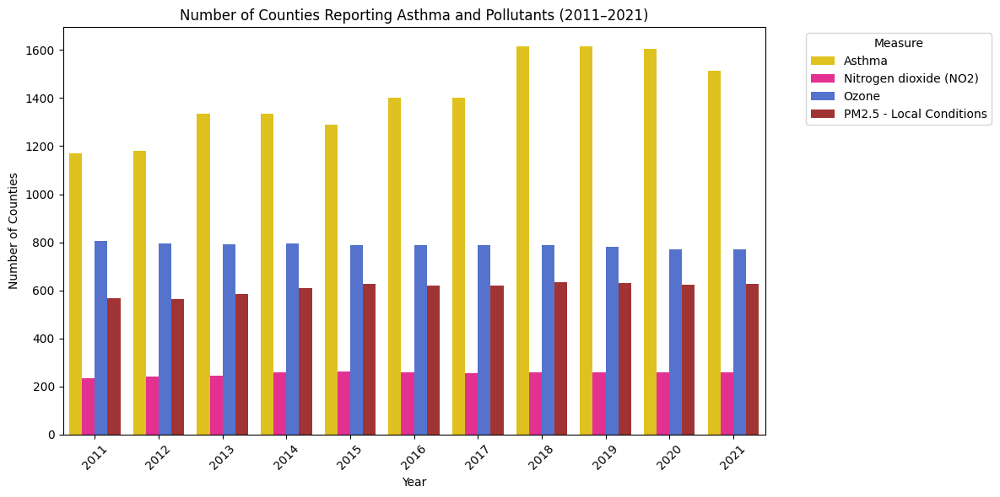

In [ ]:
# number of counties reporting asthma and pollutants independently per year

asthma_summary = (
    asthma_df.groupby("Year")["CountyFIPS"]
    .nunique()
    .reset_index(name="Num_Counties")
    .assign(Measure="Asthma")
)

pollutant_summary = (
    pollution_df.groupby(["Year", "Parameter Name"])["FIPS"]
    .nunique()
    .reset_index(name="Num_Counties")
    .rename(columns={"Parameter Name": "Measure"})
)

reporting_summary = pd.concat([asthma_summary, pollutant_summary], ignore_index=True)

palette = {
    "Asthma": "gold",
    "Nitrogen dioxide (NO2)": "deeppink",
    "Ozone": "royalblue",
    "PM2.5 - Local Conditions": "firebrick"
}

plt.figure(figsize=(12,6))
sns.barplot(data=reporting_summary, x="Year", y="Num_Counties", hue="Measure", palette=palette)
plt.title("Number of Counties Reporting Asthma and Pollutants (2011–2021)")
plt.ylabel("Number of Counties")
plt.xticks(rotation=45)
plt.legend(title="Measure", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("reporting_summary.png", dpi=300, bbox_inches="tight")
plt.show()



In [ ]:
# prepare county shapefile and merge with pm2.5 data only

zip_path = "/content/cb_2021_us_county_20m.zip"
extract_dir = "/content/county_shapefile"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

shp_path = os.path.join(extract_dir, "cb_2021_us_county_20m.shp")
counties = gpd.read_file(shp_path)

counties = counties[~counties["STATEFP"].isin(["02", "15", "72"])].copy()
counties["FIPS"] = counties["STATEFP"] + counties["COUNTYFP"]

pm25_counts = (
    pollution_df[pollution_df["Parameter Name"] == "PM2.5 - Local Conditions"]
    .groupby(["FIPS", "Year"])["Arithmetic Mean"]
    .mean()
    .reset_index()
)

pm25_counts["FIPS"] = pm25_counts["FIPS"].astype(str).str.zfill(5)
gdf_pm25 = counties.merge(pm25_counts, on="FIPS", how="left")


/tmp/ipython-input-208498766.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


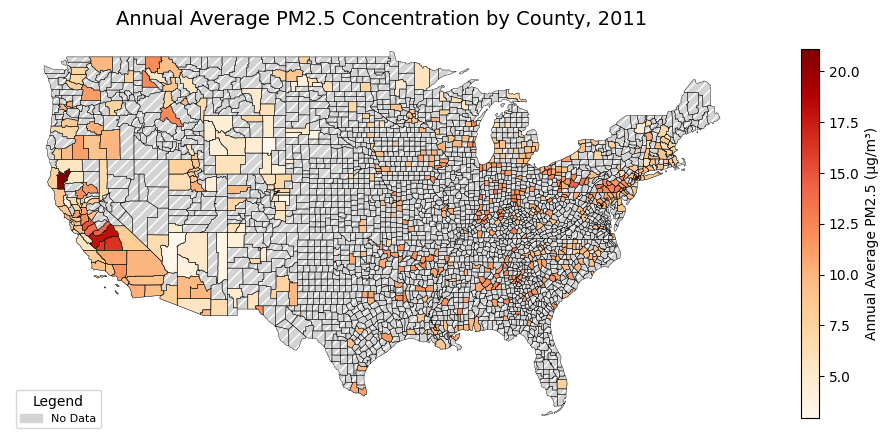

/tmp/ipython-input-208498766.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


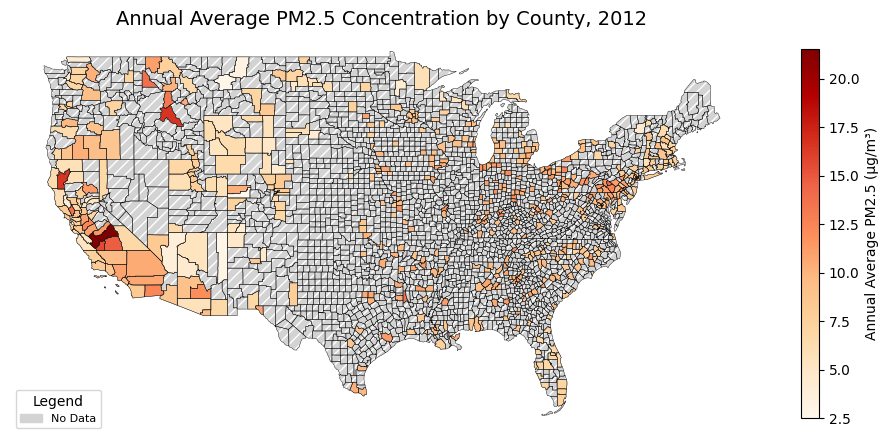

/tmp/ipython-input-208498766.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


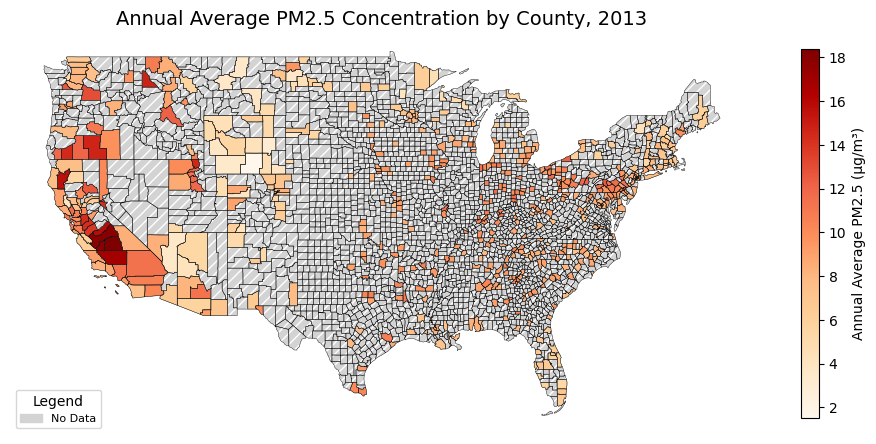

/tmp/ipython-input-208498766.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


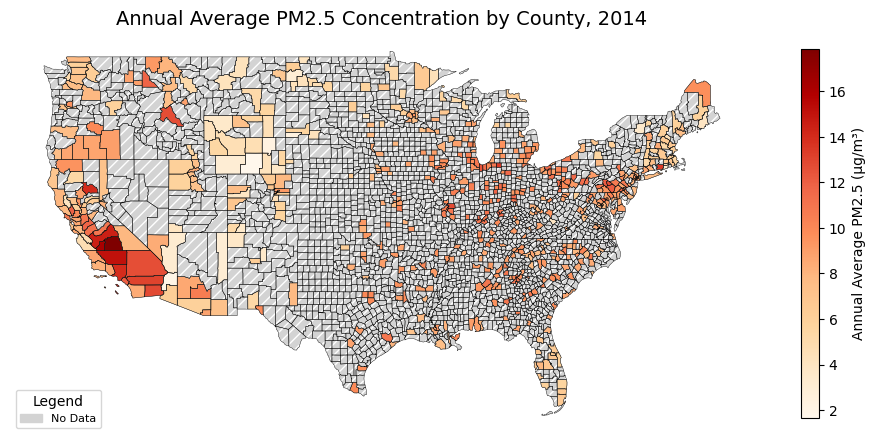

/tmp/ipython-input-208498766.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


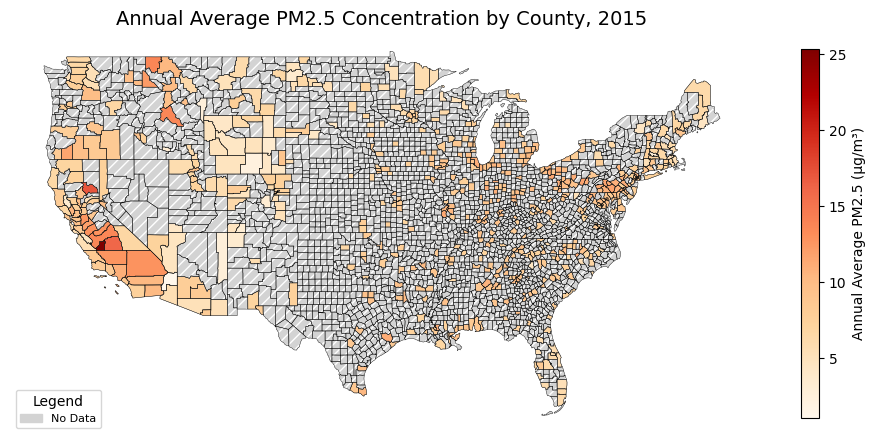

/tmp/ipython-input-208498766.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


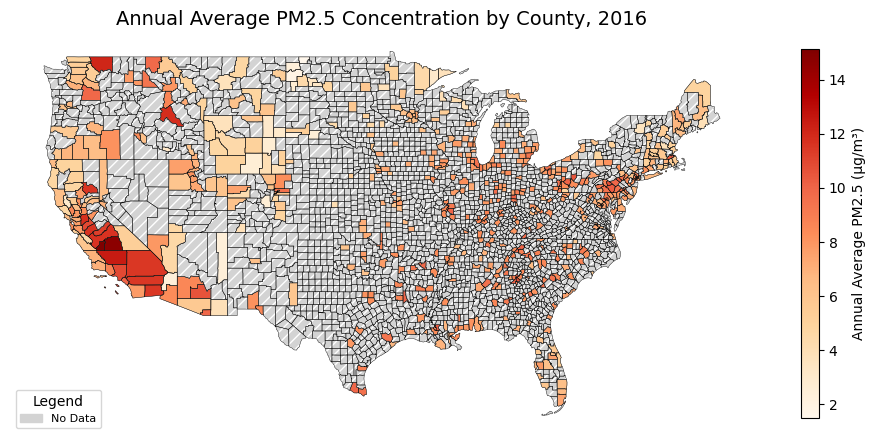

/tmp/ipython-input-208498766.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


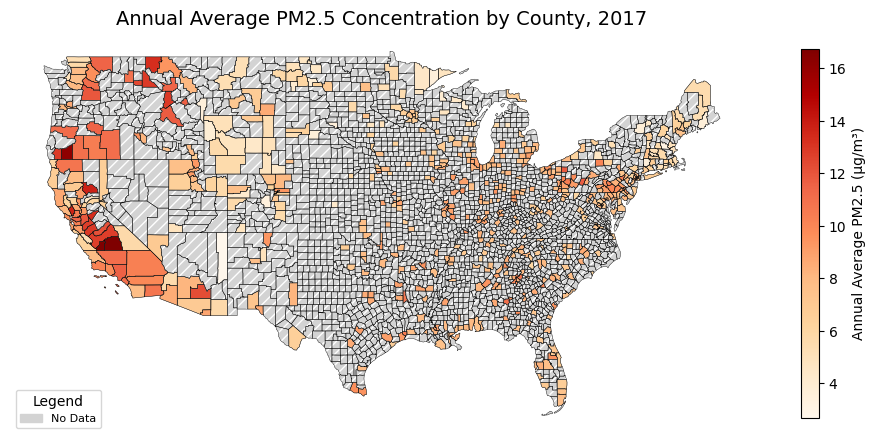

/tmp/ipython-input-208498766.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


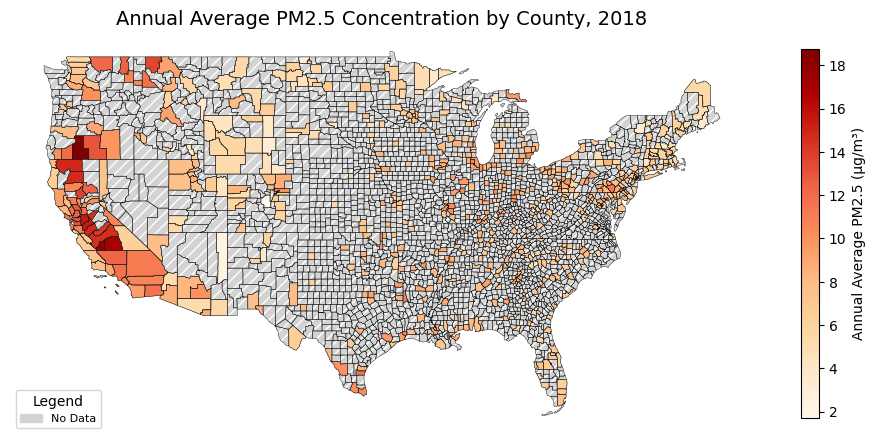

/tmp/ipython-input-208498766.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


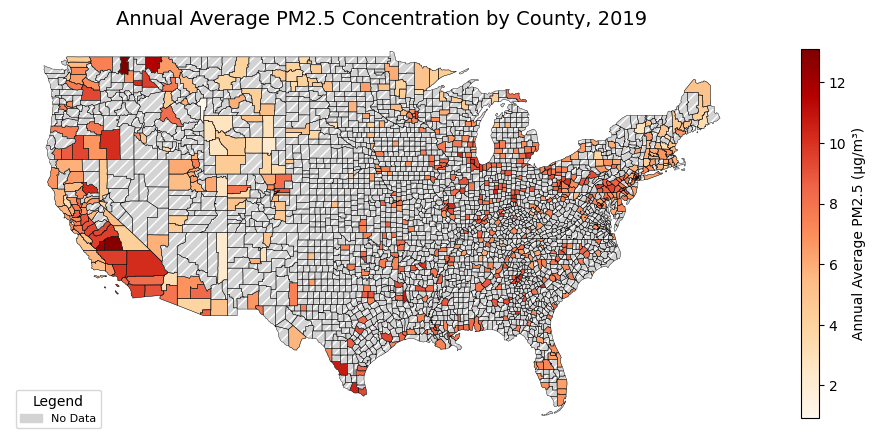

/tmp/ipython-input-208498766.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


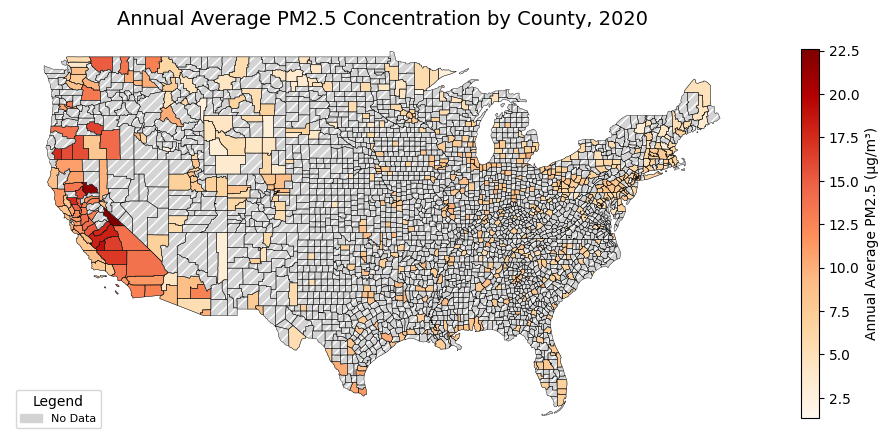

/tmp/ipython-input-208498766.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


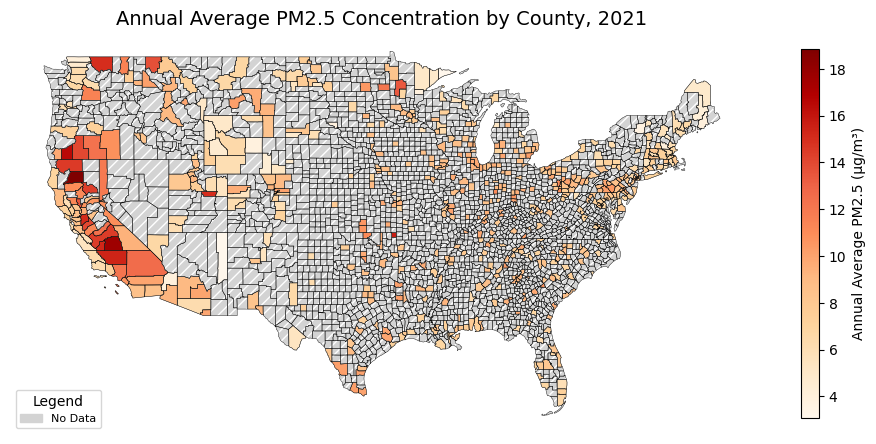

In [ ]:
# map annual average pm2.5 concentration by county with non-reporting counties in gray

years = sorted(pm25_counts["Year"].unique())

for year in years:
    merged = counties.merge(pm25_counts[pm25_counts["Year"] == year], on="FIPS", how="left")

    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    counties.boundary.plot(ax=ax, linewidth=0.3, color="black")

    merged.plot(
        column="Arithmetic Mean",
        cmap="OrRd",
        linewidth=0.2,
        ax=ax,
        edgecolor="0.4",
        legend=True,
        missing_kwds={
            "color": "lightgray",
            "edgecolor": "white",
            "hatch": "///",
            "label": "No Data"
        },
        legend_kwds={'shrink': 0.6, 'label': "Annual Average PM2.5 (µg/m³)"}
    )

    ax.set_title(f"Annual Average PM2.5 Concentration by County, {year}", fontsize=14)
    ax.axis("off")

    handles, labels = ax.get_legend_handles_labels()
    no_data_patch = mpatches.Patch(color="lightgray", hatch="///", label="No Data")
    if "No Data" not in labels:
        handles.append(no_data_patch)
        labels.append("No Data")
    ax.legend(handles, labels, title="Legend", loc='lower left', fontsize=8)

    if year == 2021:
        plt.savefig("pm25_map_2021.png", dpi=300, bbox_inches="tight")

    plt.show()





In [ ]:
# count counties reporting pm2.5 each year and percent coverage

total_counties = len(counties)

pm25_coverage = (
    pm25_counts
    .groupby("Year")["FIPS"]
    .nunique()
    .reset_index(name="Num_Reporting")
)

pm25_coverage["Percent_Coverage"] = (
    pm25_coverage["Num_Reporting"] / total_counties * 100
).round(2)

pm25_coverage


,Year,Num_Reporting,Percent_Coverage
0,2011,567,18.24
1,2012,564,18.15
2,2013,585,18.82
3,2014,611,19.66
4,2015,628,20.21
5,2016,621,19.98
6,2017,621,19.98
7,2018,635,20.43
8,2019,632,20.33
9,2020,625,20.11


In [ ]:
# prepare county shapefile and merge with ozone data only

ozone_counts = (
    pollution_df[pollution_df["Parameter Name"] == "Ozone"]
    .groupby(["FIPS", "Year"])["Arithmetic Mean"]
    .mean()
    .reset_index()
)

ozone_counts["FIPS"] = ozone_counts["FIPS"].astype(str).str.zfill(5)
gdf_ozone = counties.merge(ozone_counts, on="FIPS", how="left")


/tmp/ipython-input-977347059.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


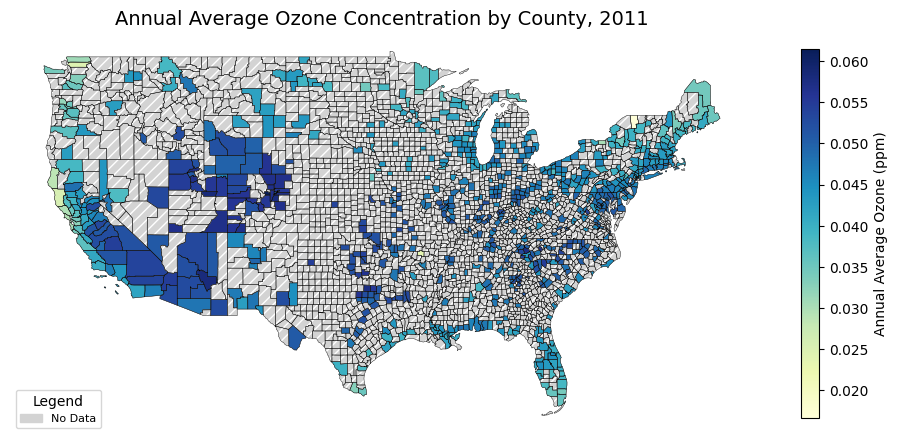

/tmp/ipython-input-977347059.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


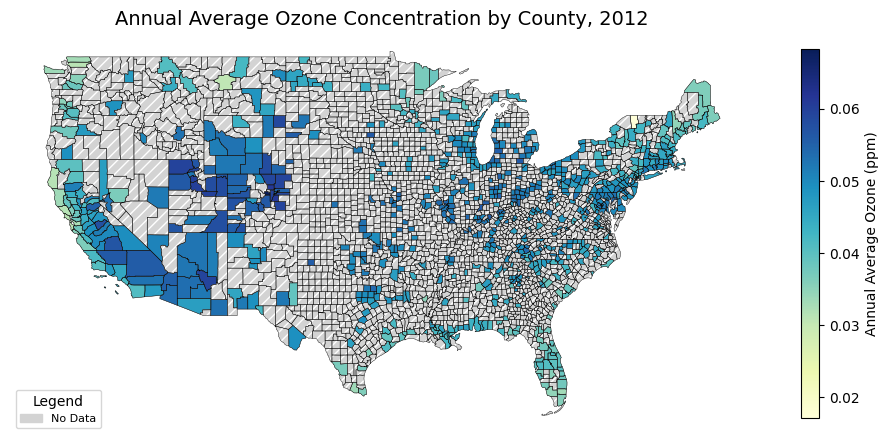

/tmp/ipython-input-977347059.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


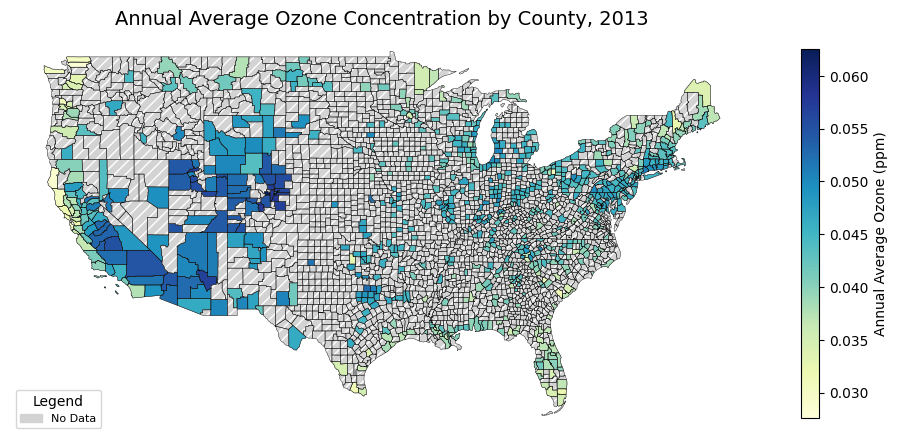

/tmp/ipython-input-977347059.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


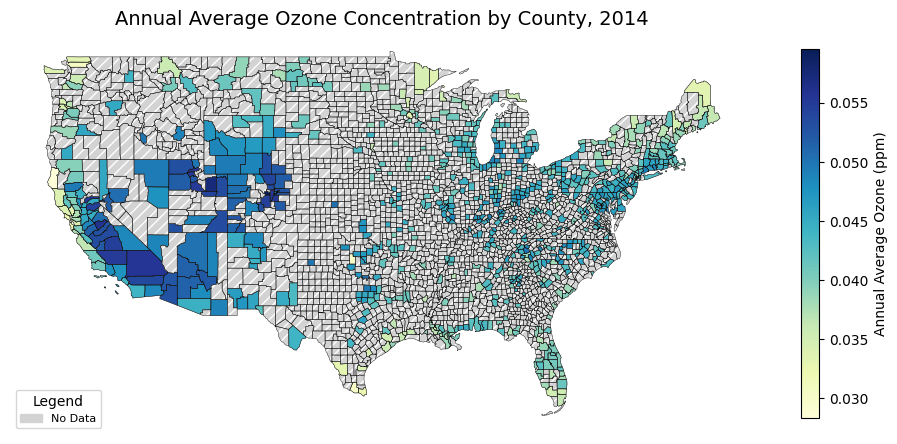

/tmp/ipython-input-977347059.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


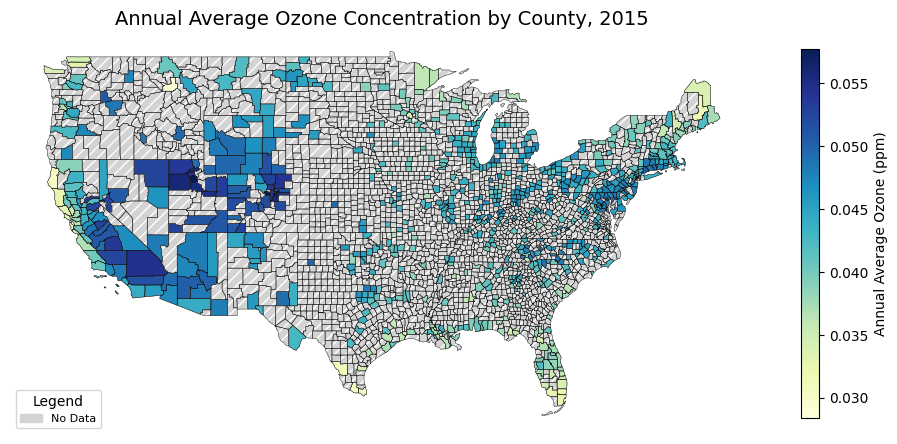

/tmp/ipython-input-977347059.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


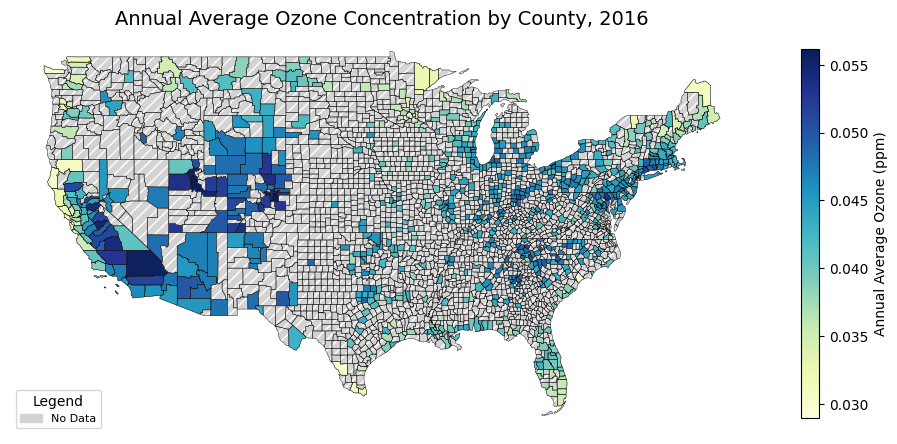

/tmp/ipython-input-977347059.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


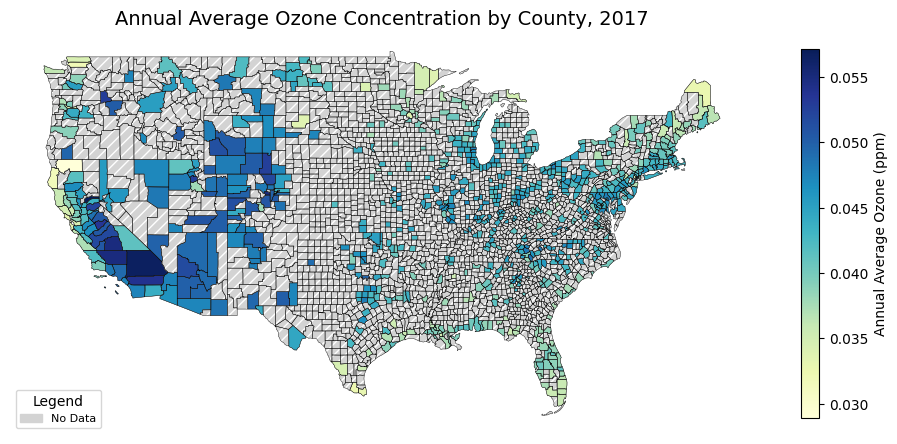

/tmp/ipython-input-977347059.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


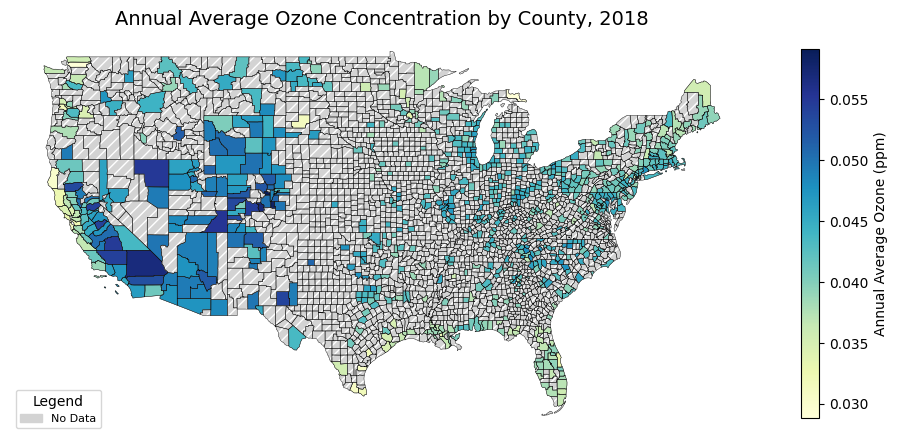

/tmp/ipython-input-977347059.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


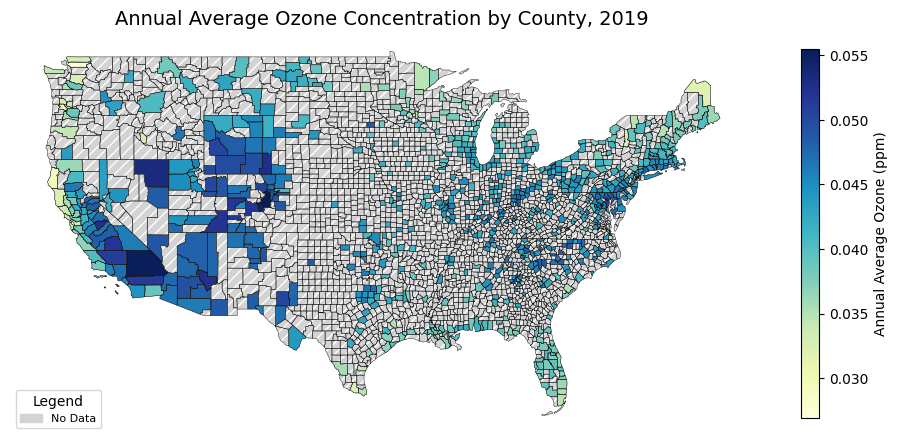

/tmp/ipython-input-977347059.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


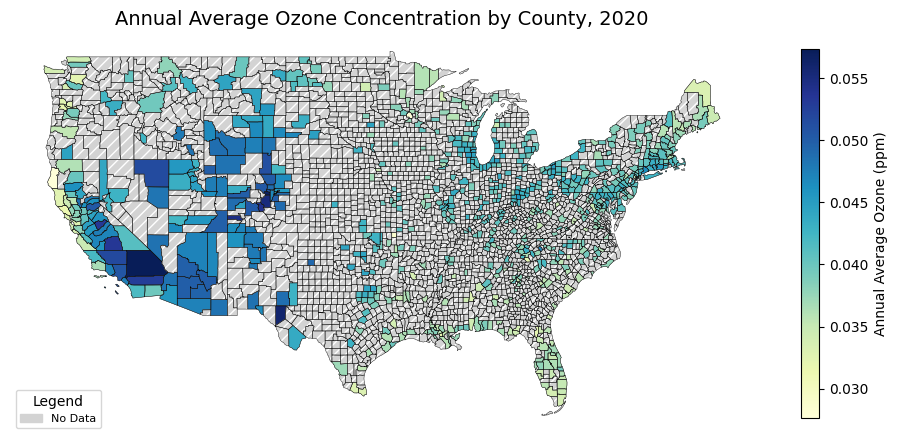

/tmp/ipython-input-977347059.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


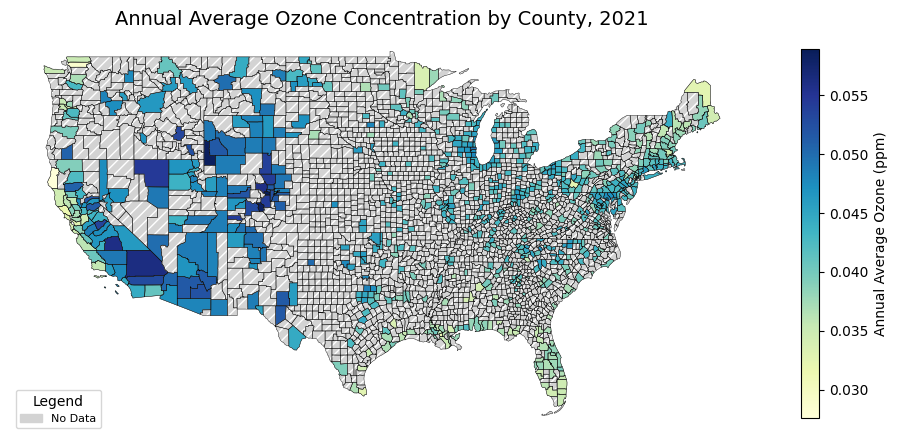

In [ ]:
# map annual average ozone concentration by county with non-reporting counties in gray

years = sorted(ozone_counts["Year"].unique())

for year in years:
    merged = counties.merge(ozone_counts[ozone_counts["Year"] == year], on="FIPS", how="left")

    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    counties.boundary.plot(ax=ax, linewidth=0.3, color="black")

    merged.plot(
        column="Arithmetic Mean",
        cmap="YlGnBu",
        linewidth=0.2,
        ax=ax,
        edgecolor="0.4",
        legend=True,
        missing_kwds={
            "color": "lightgray",
            "edgecolor": "white",
            "hatch": "///",
            "label": "No Data"
        },
        legend_kwds={'shrink': 0.6, 'label': "Annual Average Ozone (ppm)"}
    )

    ax.set_title(f"Annual Average Ozone Concentration by County, {year}", fontsize=14)
    ax.axis("off")

    handles, labels = ax.get_legend_handles_labels()
    no_data_patch = mpatches.Patch(color="lightgray", hatch="///", label="No Data")
    if "No Data" not in labels:
        handles.append(no_data_patch)
        labels.append("No Data")
    ax.legend(handles, labels, title="Legend", loc='lower left', fontsize=8)

    if year == 2021:
        plt.savefig("ozone_map_2021.png", dpi=300, bbox_inches="tight")

    plt.show()


In [ ]:
# count counties reporting ozone each year and percent coverage

total_counties = len(counties)

ozone_coverage = (
    ozone_counts
    .groupby("Year")["FIPS"]
    .nunique()
    .reset_index(name="Num_Reporting")
)

ozone_coverage["Percent_Coverage"] = (
    ozone_coverage["Num_Reporting"] / total_counties * 100
).round(2)

ozone_coverage


,Year,Num_Reporting,Percent_Coverage
0,2011,804,25.87
1,2012,795,25.58
2,2013,792,25.48
3,2014,796,25.61
4,2015,789,25.39
5,2016,788,25.35
6,2017,789,25.39
7,2018,788,25.35
8,2019,780,25.10
9,2020,770,24.77


In [ ]:
# prepare county shapefile and merge with no2 data only

no2_counts = (
    pollution_df[pollution_df["Parameter Name"] == "Nitrogen dioxide (NO2)"]
    .groupby(["FIPS", "Year"])["Arithmetic Mean"]
    .mean()
    .reset_index()
)

no2_counts["FIPS"] = no2_counts["FIPS"].astype(str).str.zfill(5)
gdf_no2 = counties.merge(no2_counts, on="FIPS", how="left")


/tmp/ipython-input-2283098323.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


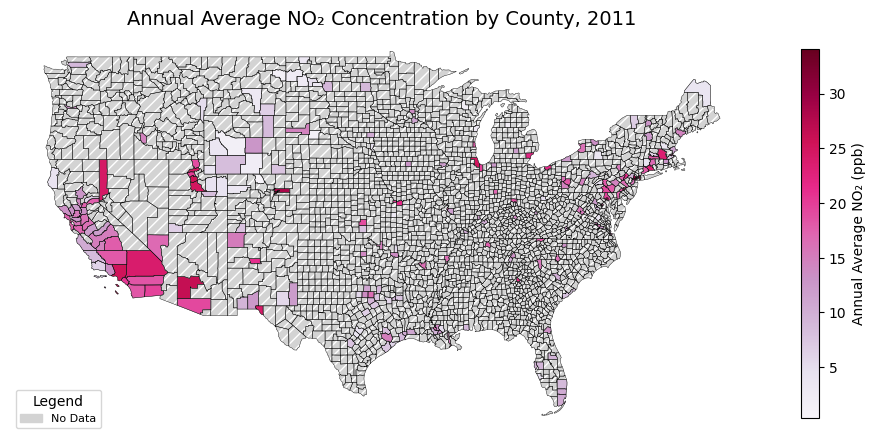

/tmp/ipython-input-2283098323.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


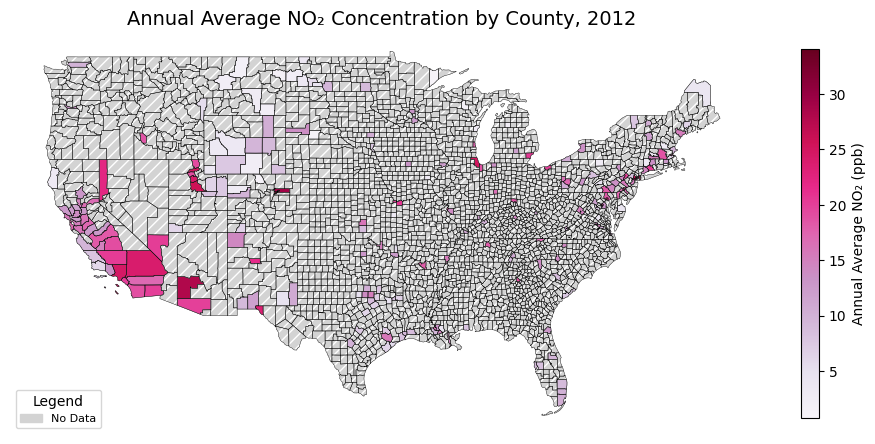

/tmp/ipython-input-2283098323.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


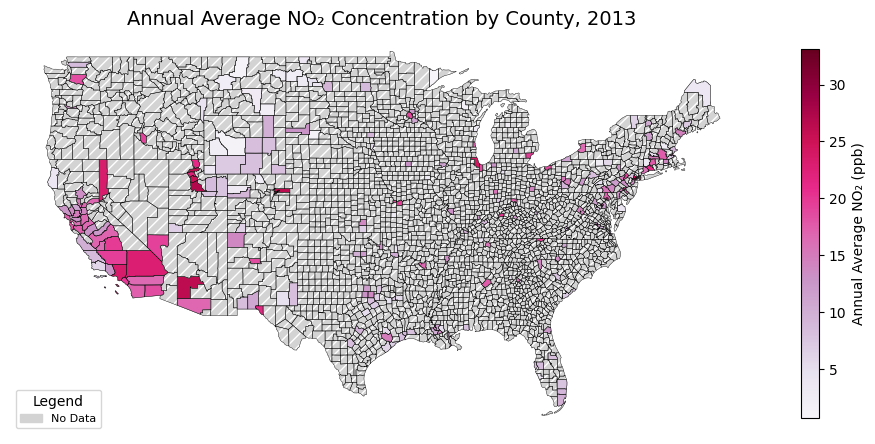

/tmp/ipython-input-2283098323.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


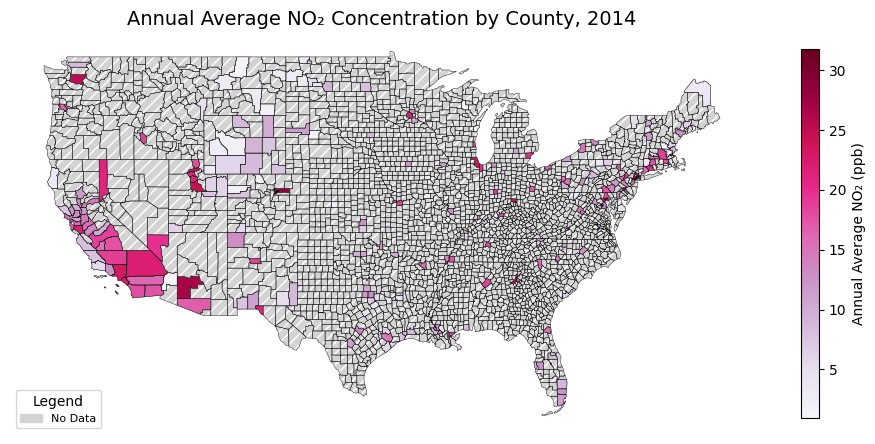

/tmp/ipython-input-2283098323.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


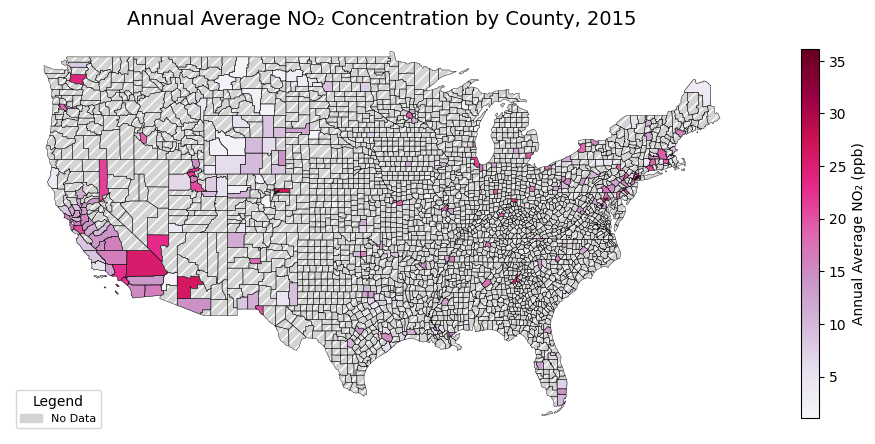

/tmp/ipython-input-2283098323.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


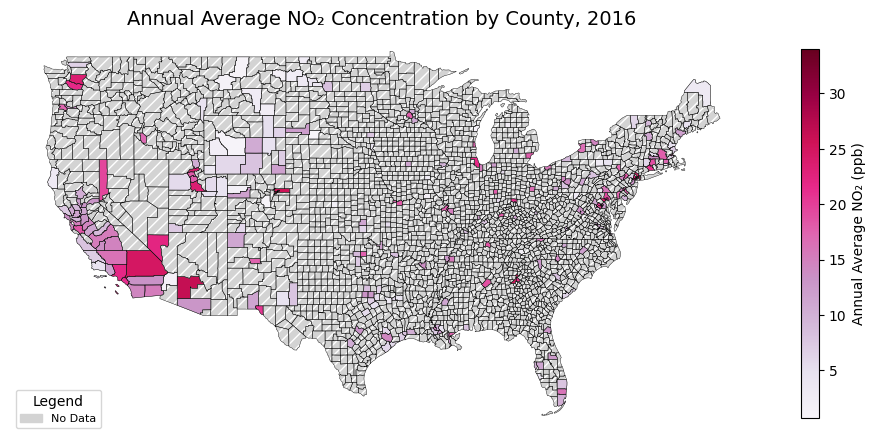

/tmp/ipython-input-2283098323.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


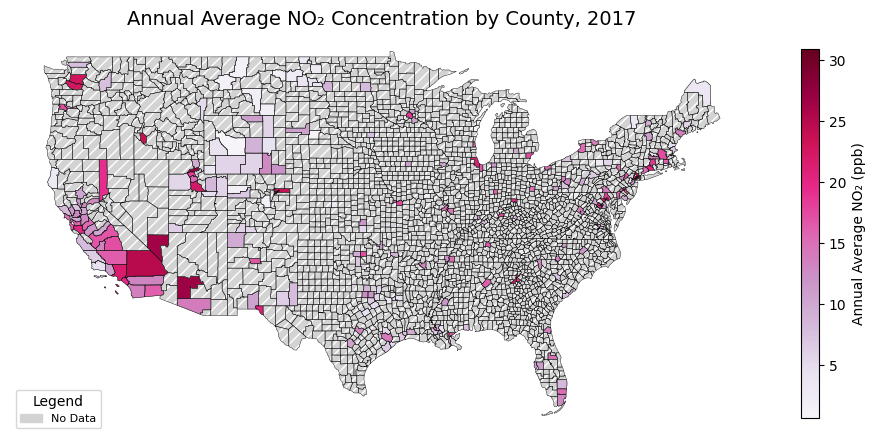

/tmp/ipython-input-2283098323.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


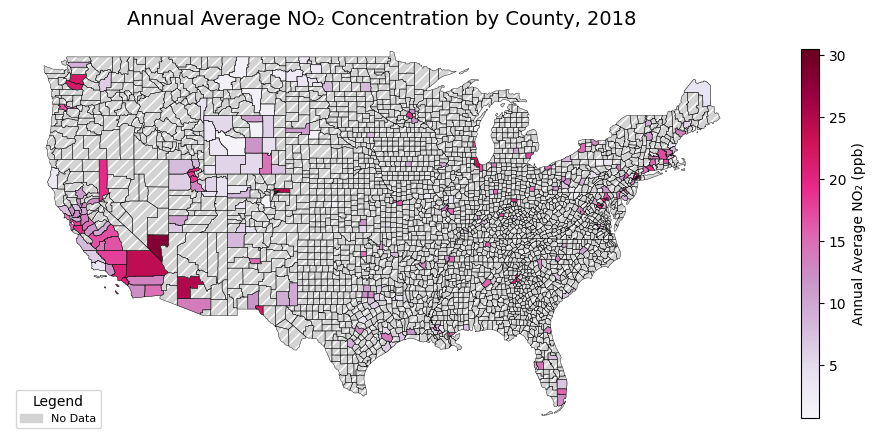

/tmp/ipython-input-2283098323.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


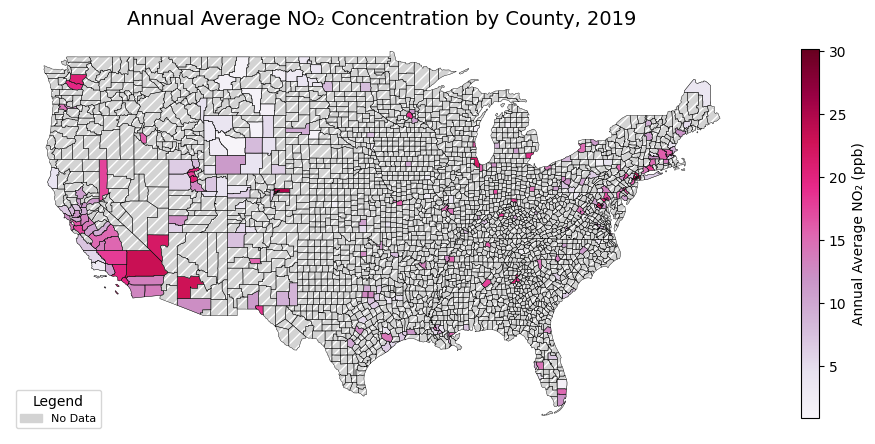

/tmp/ipython-input-2283098323.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


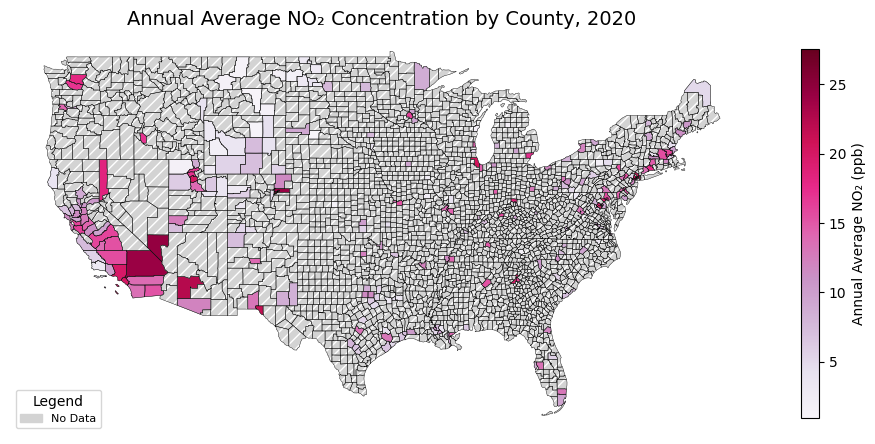

/tmp/ipython-input-2283098323.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


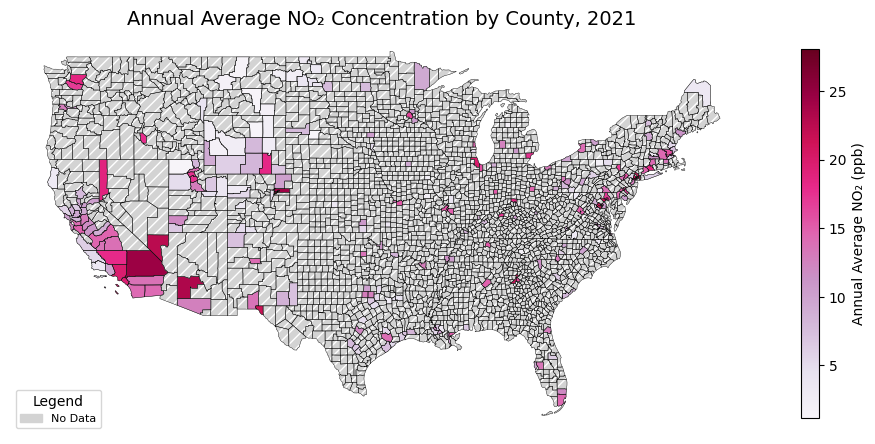

In [ ]:
# map annual average no2 concentration by county with non-reporting counties in gray

years = sorted(no2_counts["Year"].unique())

for year in years:
    merged = counties.merge(no2_counts[no2_counts["Year"] == year], on="FIPS", how="left")

    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    counties.boundary.plot(ax=ax, linewidth=0.3, color="black")

    merged.plot(
        column="Arithmetic Mean",
        cmap="PuRd",
        linewidth=0.2,
        ax=ax,
        edgecolor="0.4",
        legend=True,
        missing_kwds={
            "color": "lightgray",
            "edgecolor": "white",
            "hatch": "///",
            "label": "No Data"
        },
        legend_kwds={'shrink': 0.6, 'label': "Annual Average NO₂ (ppb)"}
    )

    ax.set_title(f"Annual Average NO₂ Concentration by County, {year}", fontsize=14)
    ax.axis("off")

    handles, labels = ax.get_legend_handles_labels()
    no_data_patch = mpatches.Patch(color="lightgray", hatch="///", label="No Data")
    if "No Data" not in labels:
        handles.append(no_data_patch)
        labels.append("No Data")
    ax.legend(handles, labels, title="Legend", loc='lower left', fontsize=8)

    if year == 2021:
        plt.savefig("no2_map_2021.png", dpi=300, bbox_inches="tight")

    plt.show()


In [ ]:
# count counties reporting no2 each year and percent coverage

total_counties = len(counties)

no2_coverage = (
    no2_counts
    .groupby("Year")["FIPS"]
    .nunique()
    .reset_index(name="Num_Reporting")
)

no2_coverage["Percent_Coverage"] = (
    no2_coverage["Num_Reporting"] / total_counties * 100
).round(2)

no2_coverage


,Year,Num_Reporting,Percent_Coverage
0,2011,235,7.56
1,2012,240,7.72
2,2013,245,7.88
3,2014,259,8.33
4,2015,261,8.40
5,2016,259,8.33
6,2017,257,8.27
7,2018,259,8.33
8,2019,258,8.30
9,2020,259,8.33


In [ ]:
# prepare county shapefile and merge with asthma data only

asthma_counts = (
    asthma_df[["CountyFIPS", "Year", "Value"]]
    .rename(columns={"Value": "Asthma Rate"})
    .copy()
)

asthma_counts["CountyFIPS"] = asthma_counts["CountyFIPS"].astype(str).str.zfill(5)
gdf_asthma = counties.merge(asthma_counts, left_on="FIPS", right_on="CountyFIPS", how="left")


/tmp/ipython-input-533549211.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


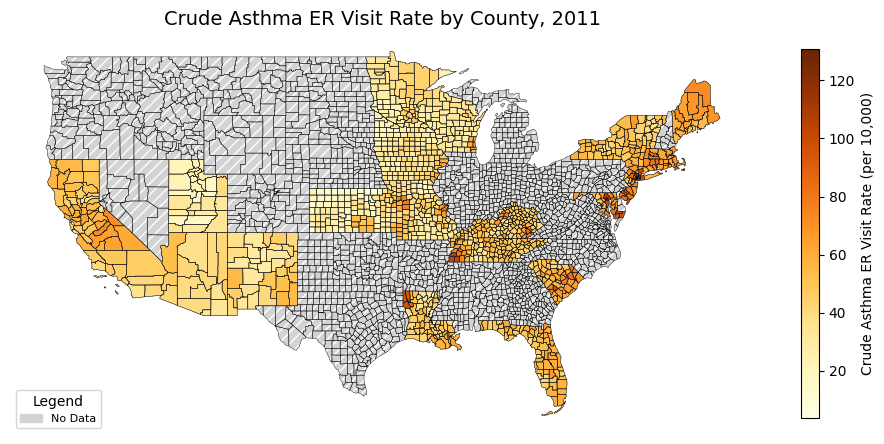

/tmp/ipython-input-533549211.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


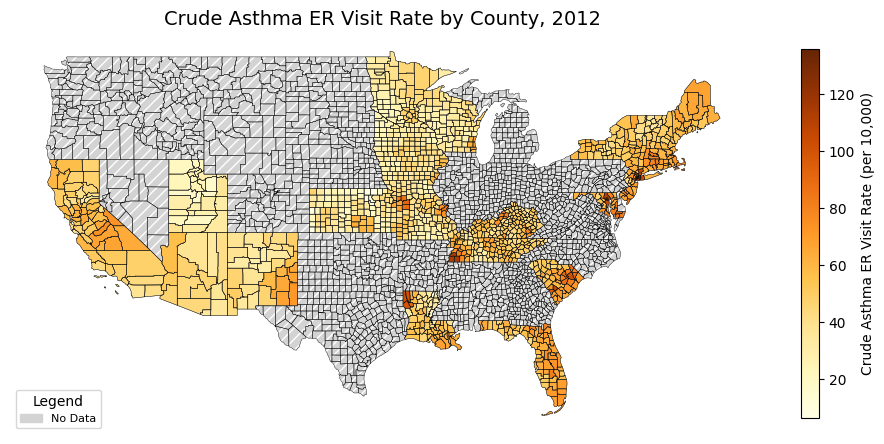

/tmp/ipython-input-533549211.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


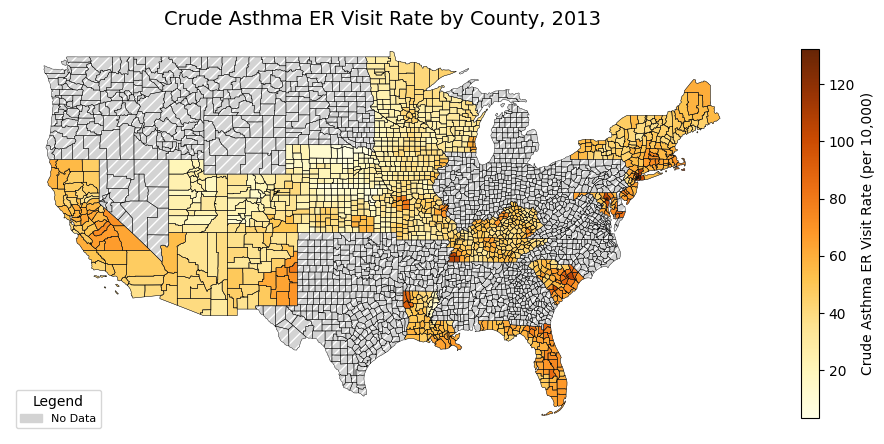

/tmp/ipython-input-533549211.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


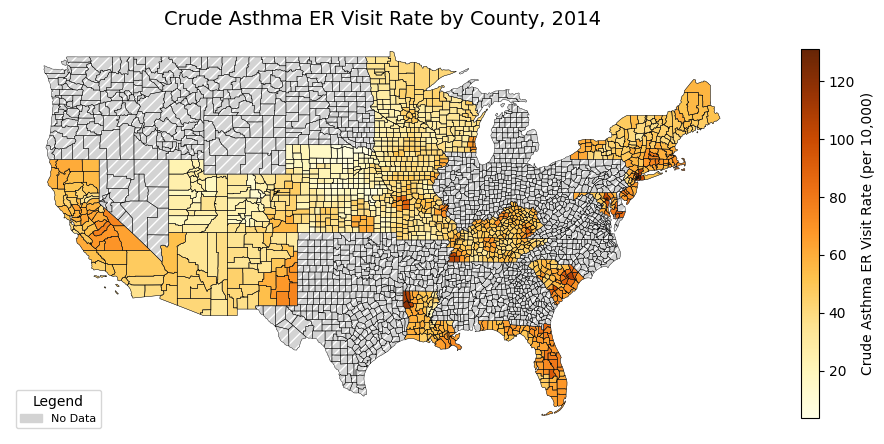

/tmp/ipython-input-533549211.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


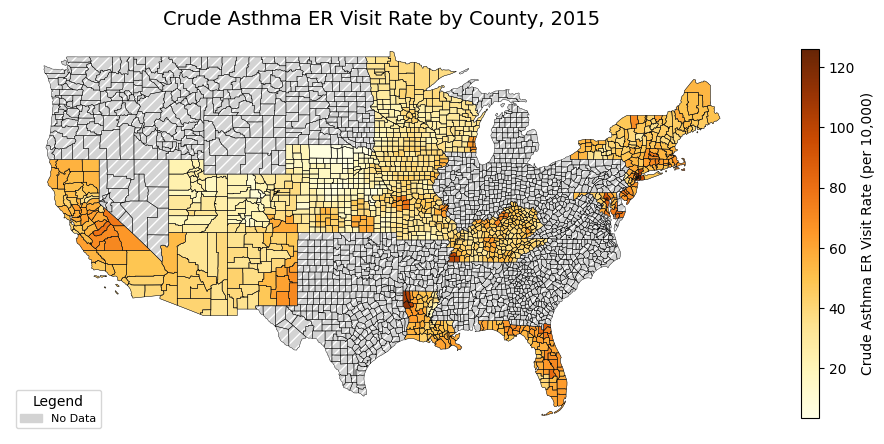

/tmp/ipython-input-533549211.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


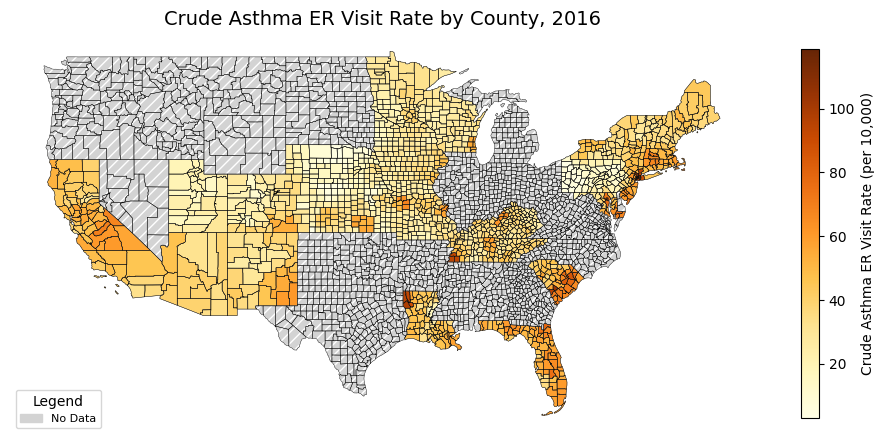

/tmp/ipython-input-533549211.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


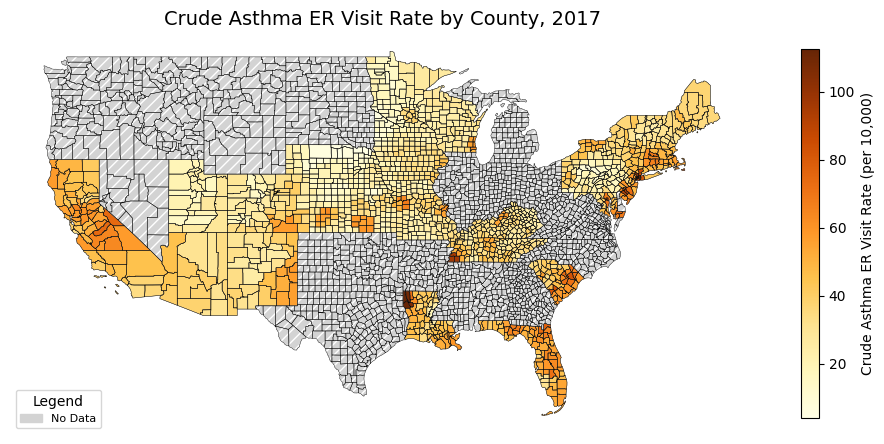

/tmp/ipython-input-533549211.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


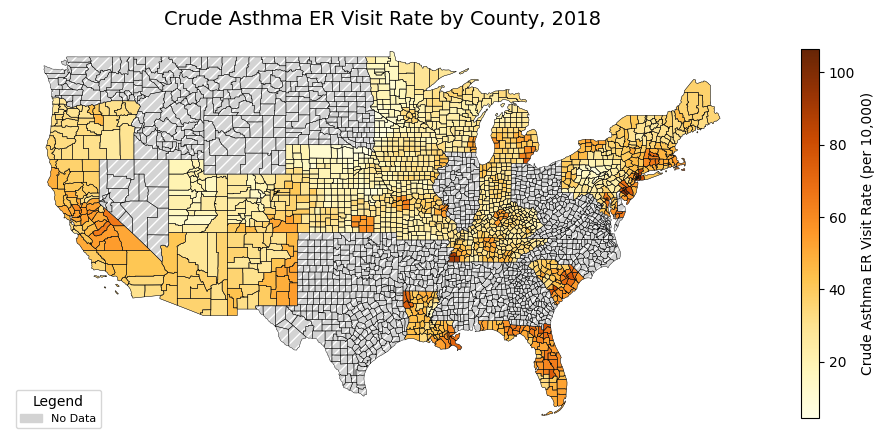

/tmp/ipython-input-533549211.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


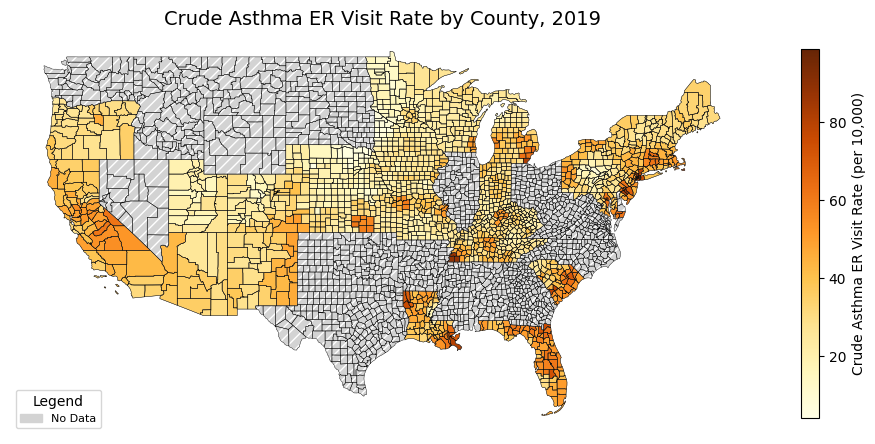

/tmp/ipython-input-533549211.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


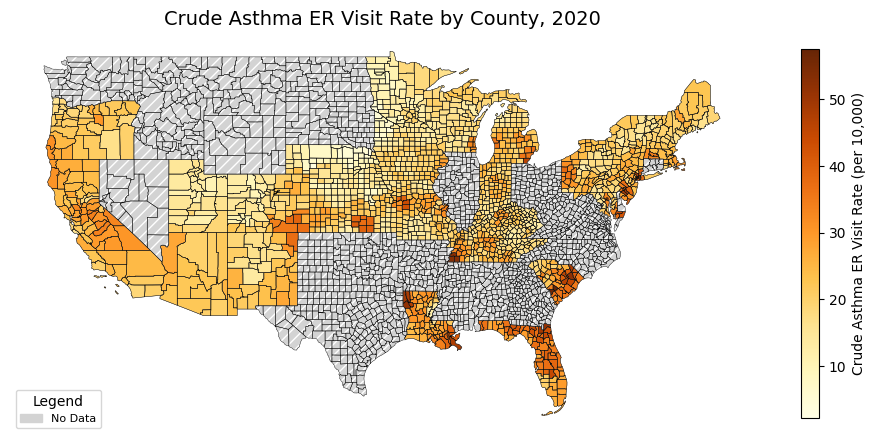

/tmp/ipython-input-533549211.py:31: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


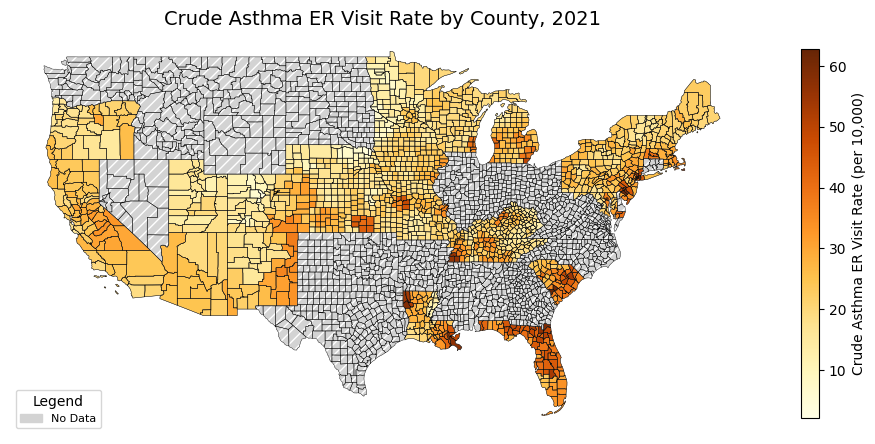

In [ ]:
# map crude asthma er visit rates by county with non-reporting counties in gray

years = sorted(asthma_counts["Year"].unique())

for year in years:
    merged = counties.merge(asthma_counts[asthma_counts["Year"] == year],
                            left_on="FIPS", right_on="CountyFIPS", how="left")

    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    counties.boundary.plot(ax=ax, linewidth=0.3, color="black")

    merged.plot(
        column="Asthma Rate",
        cmap="YlOrBr",
        linewidth=0.2,
        ax=ax,
        edgecolor="0.4",
        legend=True,
        missing_kwds={
            "color": "lightgray",
            "edgecolor": "white",
            "hatch": "///",
            "label": "No Data"
        },
        legend_kwds={'shrink': 0.6, 'label': "Crude Asthma ER Visit Rate (per 10,000)"}
    )

    ax.set_title(f"Crude Asthma ER Visit Rate by County, {year}", fontsize=14)
    ax.axis("off")

    handles, labels = ax.get_legend_handles_labels()
    no_data_patch = mpatches.Patch(color="lightgray", hatch="///", label="No Data")
    if "No Data" not in labels:
        handles.append(no_data_patch)
        labels.append("No Data")
    ax.legend(handles, labels, title="Legend", loc='lower left', fontsize=8)

    if year == 2021:
        plt.savefig("asthma_map_2021.png", dpi=300, bbox_inches="tight")

    plt.show()


In [ ]:
# count counties reporting asthma rates each year and percent coverage

total_counties = len(counties)

asthma_coverage = (
    asthma_counts
    .groupby("Year")["CountyFIPS"]
    .nunique()
    .reset_index(name="Num_Reporting")
)

asthma_coverage["Percent_Coverage"] = (
    asthma_coverage["Num_Reporting"] / total_counties * 100
).round(2)

asthma_coverage


,Year,Num_Reporting,Percent_Coverage
0,2011,1169,37.61
1,2012,1179,37.93
2,2013,1336,42.99
3,2014,1336,42.99
4,2015,1290,41.51
5,2016,1403,45.14
6,2017,1403,45.14
7,2018,1614,51.93
8,2019,1614,51.93
9,2020,1606,51.67


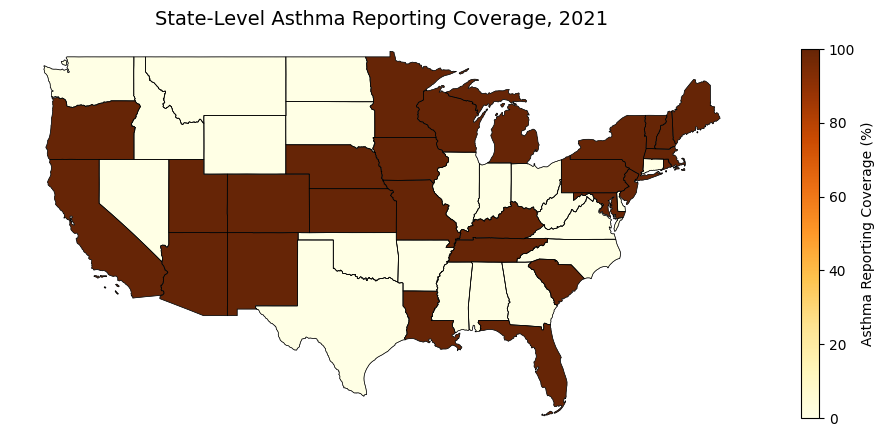

In [ ]:
# state-level coverage map for 2021 (percent of counties reporting asthma or pollutants)

state_total = counties.groupby("STATEFP")["FIPS"].nunique().reset_index(name="Total_Counties")

asthma_2021 = (
    asthma_df[asthma_df["Year"] == 2021]
    .groupby("StateFIPS")["CountyFIPS"]
    .nunique()
    .reset_index(name="Asthma_Reporting")
)

pollutant_2021 = (
    pollution_df[pollution_df["Year"] == 2021]
    .groupby(["State Code", "Parameter Name"])["FIPS"]
    .nunique()
    .reset_index()
    .pivot(index="State Code", columns="Parameter Name", values="FIPS")
    .reset_index()
    .rename(columns={
        "PM2.5 - Local Conditions": "PM2.5_Reporting",
        "Ozone": "Ozone_Reporting",
        "Nitrogen dioxide (NO2)": "NO2_Reporting"
    })
)

state_cov = (
    state_total
    .merge(asthma_2021, left_on="STATEFP", right_on="StateFIPS", how="left")
    .merge(pollutant_2021, left_on="STATEFP", right_on="State Code", how="left")
    .fillna(0)
)

for col in ["Asthma_Reporting", "PM2.5_Reporting", "Ozone_Reporting", "NO2_Reporting"]:
    state_cov[col + "_Pct"] = (state_cov[col] / state_cov["Total_Counties"] * 100).round(2)

state_shp = counties.dissolve(by="STATEFP").reset_index()
state_gdf = state_shp.merge(state_cov, on="STATEFP", how="left")

fig, ax = plt.subplots(1, 1, figsize=(12, 8))
state_gdf.boundary.plot(ax=ax, linewidth=0.5, color="black")

state_gdf.plot(
    column="Asthma_Reporting_Pct",
    cmap="YlOrBr",
    linewidth=0.3,
    ax=ax,
    edgecolor="0.4",
    legend=True,
    missing_kwds={
        "color": "lightgray",
        "edgecolor": "white",
        "hatch": "///",
        "label": "No Data"
    },
    legend_kwds={'shrink': 0.6, 'label': "Asthma Reporting Coverage (%)"}
)

ax.set_title("State-Level Asthma Reporting Coverage, 2021", fontsize=14)
ax.axis("off")

plt.show()


In [ ]:

# table of top 5 and bottom 5 counties by asthma rate in 2021 with pollutants, population, income, and group label

asthma_2021 = merged_df[merged_df["Year"] == 2021].copy()
asthma_2021["CountyFIPS"] = asthma_2021["CountyFIPS"].astype(str).str.zfill(5)

lookup = counties[["FIPS", "NAME", "STATEFP"]].copy()
state_lookup = counties[["STATEFP", "STUSPS"]].drop_duplicates()
lookup = lookup.merge(state_lookup, on="STATEFP", how="left")

df2021 = (
    asthma_2021.merge(lookup, left_on="CountyFIPS", right_on="FIPS", how="left")
    .rename(columns={
        "NAME": "County",
        "STUSPS": "State",
        "PM2.5 - Local Conditions": "PM2.5",
        "Median household income raw value": "Median Household Income",
        "Population raw value": "Population"
    })
)

df2021 = df2021[[
    "CountyFIPS", "County", "State", "Asthma Rate", "PM2.5", "Ozone", "Nitrogen dioxide (NO2)",
    "Population", "Median Household Income"
]]

top5 = df2021.sort_values("Asthma Rate", ascending=False).head(5).copy()
top5["Group"] = "Top 5"

bottom5 = df2021.sort_values("Asthma Rate", ascending=True).head(5).copy()
bottom5["Group"] = "Bottom 5"

ranking_table = pd.concat([top5, bottom5]).reset_index(drop=True)
ranking_table





,CountyFIPS,County,County,State,State,Asthma Rate,PM2.5,Ozone,Nitrogen dioxide (NO2),Population,Median Household Income,Group
0,34015,Gloucester,Gloucester,New Jersey,NJ,61.4,7.717797,0.043214,NaN,291636,87996,Top 5
1,34003,Bergen,Bergen,New Jersey,NJ,58.4,8.348513,0.040377,21.685618,932202,107971,Top 5
2,34007,Camden,Camden,New Jersey,NJ,58.4,9.781459,0.042121,17.317998,506471,73168,Top 5
3,36061,New York,New York,New York,NY,56.3,7.670478,0.041865,NaN,1628706,93007,Top 5
4,12003,Baker,Baker,Florida,FL,56.1,NaN,0.036135,NaN,29210,60454,Top 5
5,31107,Knox,Knox,Nebraska,NE,6.2,NaN,0.046253,NaN,8332,53676,Bottom 5
6,08049,Grand,Grand,Colorado,CO,9.9,NaN,0.055852,NaN,15734,71029,Bottom 5
7,27083,Lyon,Lyon,Minnesota,MN,10.5,7.462540,0.044043,NaN,25474,63849,Bottom 5
8,27021,Cass,Cass,Minnesota,MN,11.3,13.378620,NaN,NaN,29779,54267,Bottom 5
9,49013,Duchesne,Duchesne,Utah,UT,11.7,6.040125,0.045876,6.680338,19938,59437,Bottom 5


/tmp/ipython-input-2328044455.py:75: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


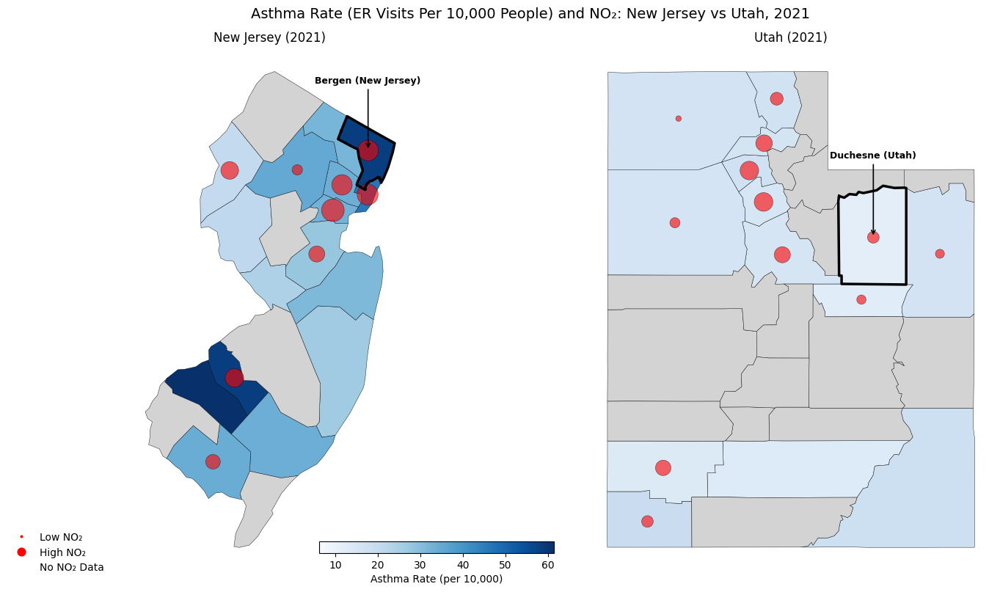

In [ ]:
# state-wide county maps for 2021: asthma rate background (Blues), NO2 bubble size only where reported, highlight Bergen NJ and Duchesne UT with fixed legends
import numpy as np
df21 = (
    merged_df[merged_df["Year"] == 2021]
    [["CountyFIPS","Asthma Rate","Nitrogen dioxide (NO2)","County","State"]]
    .assign(CountyFIPS=lambda d: d["CountyFIPS"].astype(str).str.zfill(5))
)

counties = counties.copy()
counties["FIPS"] = (counties["STATEFP"] + counties["COUNTYFP"]).astype(str).str.zfill(5)

nj = counties[counties["STATEFP"] == "34"].merge(df21, left_on="FIPS", right_on="CountyFIPS", how="left")
ut = counties[counties["STATEFP"] == "49"].merge(df21, left_on="FIPS", right_on="CountyFIPS", how="left")

nj = nj.to_crs(epsg=3857)
ut = ut.to_crs(epsg=3857)

asth_min, asth_max = df21["Asthma Rate"].min(), df21["Asthma Rate"].max()
no2_min, no2_max = df21["Nitrogen dioxide (NO2)"].min(), df21["Nitrogen dioxide (NO2)"].max()

def scale_no2(x):
    return 30 + 500 * (0 if pd.isna(x) or no2_max==no2_min else (x - no2_min)/(no2_max - no2_min))

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

for gdf, ax, title, highlight, arrow_shift in [
    (nj, axes[0], "New Jersey (2021)", "34003", (0, 50000)),
    (ut, axes[1], "Utah (2021)", "49013", (0, 120000))
]:
    gdf.plot(column="Asthma Rate", cmap="Blues", vmin=asth_min, vmax=asth_max,
             missing_kwds={"color":"lightgray","label":"No Asthma Data"},
             edgecolor="black", linewidth=0.3, ax=ax)
    cent = gdf.geometry.centroid
    mask = gdf["Nitrogen dioxide (NO2)"].notna()
    ax.scatter(
        cent[mask].x, cent[mask].y,
        s=gdf.loc[mask,"Nitrogen dioxide (NO2)"].apply(scale_no2),
        c="red", alpha=0.6, edgecolor="black", linewidth=0.4,
        label="NO₂ Reported"
    )
    ax.set_title(title, fontsize=12)
    ax.axis("off")

    focus = gdf[gdf["CountyFIPS"] == highlight]
    if not focus.empty:
        geom = focus.geometry.values[0]
        ax.plot(*geom.exterior.xy, color="black", linewidth=2.5)
        cx, cy = geom.centroid.x, geom.centroid.y
        name = f"{focus['County'].values[0]} ({focus['State'].values[0]})"
        ax.annotate(name, xy=(cx, cy), xytext=(cx + arrow_shift[0], cy + arrow_shift[1]),
                    ha="center", fontsize=9, weight="bold",
                    arrowprops=dict(arrowstyle="->", color="black", lw=1.2))

from matplotlib.cm import ScalarMappable
import matplotlib as mpl

sm_asth = ScalarMappable(norm=mpl.colors.Normalize(vmin=asth_min, vmax=asth_max), cmap="Blues")
sm_asth.set_array([])
cbar1 = fig.colorbar(sm_asth, ax=axes, fraction=0.025, pad=0.05, location="bottom")
cbar1.set_label("Asthma Rate (per 10,000)")
cbar1.ax.set_position([0.12, 0.05, 0.6, 0.02])

import matplotlib.lines as mlines
bubble_legend = [
    mlines.Line2D([], [], color="red", marker="o", linestyle="None",
                  markersize=np.sqrt(scale_no2(no2_min))/3, label="Low NO₂"),
    mlines.Line2D([], [], color="red", marker="o", linestyle="None",
                  markersize=np.sqrt(scale_no2(no2_max))/3, label="High NO₂"),
    mlines.Line2D([], [], color="none", marker=None, linestyle="None", label="No NO₂ Data")
]

fig.legend(handles=bubble_legend, loc="lower left", ncol=1, bbox_to_anchor=(0.05, 0.0), frameon=False)

plt.suptitle("Asthma Rate (ER Visits Per 10,000 People) and NO₂: New Jersey vs Utah, 2021", fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
# overlap reporting: count counties with both asthma and each pollutant by year

asthma_counts = asthma_df[["CountyFIPS", "Year", "Value"]].rename(columns={"Value": "Asthma Rate"})
asthma_counts["CountyFIPS"] = asthma_counts["CountyFIPS"].astype(str).str.zfill(5)

pm25_counts = (
    pollution_df[pollution_df["Parameter Name"] == "PM2.5 - Local Conditions"]
    .groupby(["FIPS", "Year"])["Arithmetic Mean"].mean().reset_index().rename(columns={"Arithmetic Mean": "PM2.5"})
)
ozone_counts = (
    pollution_df[pollution_df["Parameter Name"] == "Ozone"]
    .groupby(["FIPS", "Year"])["Arithmetic Mean"].mean().reset_index().rename(columns={"Arithmetic Mean": "Ozone"})
)
no2_counts = (
    pollution_df[pollution_df["Parameter Name"] == "Nitrogen dioxide (NO2)"]
    .groupby(["FIPS", "Year"])["Arithmetic Mean"].mean().reset_index().rename(columns={"Arithmetic Mean": "NO2"})
)

overlap_pm25 = asthma_counts.merge(pm25_counts, left_on=["CountyFIPS","Year"], right_on=["FIPS","Year"], how="inner")
overlap_ozone = asthma_counts.merge(ozone_counts, left_on=["CountyFIPS","Year"], right_on=["FIPS","Year"], how="inner")
overlap_no2 = asthma_counts.merge(no2_counts, left_on=["CountyFIPS","Year"], right_on=["FIPS","Year"], how="inner")

overlap_summary = pd.DataFrame({
    "Year": sorted(asthma_counts["Year"].unique()),
    "Asthma+PM2.5": [overlap_pm25[overlap_pm25["Year"]==y]["CountyFIPS"].nunique() for y in sorted(asthma_counts["Year"].unique())],
    "Asthma+Ozone": [overlap_ozone[overlap_ozone["Year"]==y]["CountyFIPS"].nunique() for y in sorted(asthma_counts["Year"].unique())],
    "Asthma+NO2": [overlap_no2[overlap_no2["Year"]==y]["CountyFIPS"].nunique() for y in sorted(asthma_counts["Year"].unique())]
})

overlap_summary


,Year,Asthma+PM2.5,Asthma+Ozone,Asthma+NO2
0,2011,225,374,121
1,2012,244,378,123
2,2013,283,397,131
3,2014,288,398,139
4,2015,282,378,137
5,2016,324,430,153
6,2017,323,429,152
7,2018,378,495,164
8,2019,375,490,165
9,2020,365,474,162


In [ ]:
# correlation matrix of asthma rates and pollutants across overlapping counties

merged_all = (
    asthma_counts
    .merge(pm25_counts, left_on=["CountyFIPS","Year"], right_on=["FIPS","Year"], how="inner")
    .merge(ozone_counts, left_on=["CountyFIPS","Year"], right_on=["FIPS","Year"], how="inner")
    .merge(no2_counts, left_on=["CountyFIPS","Year"], right_on=["FIPS","Year"], how="inner")
)

corr_matrix = merged_all[["Asthma Rate", "PM2.5", "Ozone", "NO2"]].corr(method="pearson")
corr_matrix


,Asthma Rate,PM2.5,Ozone,NO2
Asthma Rate,1.000000,0.170343,-0.026610,0.324377
PM2.5,0.170343,1.000000,0.224200,0.364274
Ozone,-0.026610,0.224200,1.000000,0.180668
NO2,0.324377,0.364274,0.180668,1.000000


In [ ]:
asthma_df["Year"] = asthma_df["Year"].astype(int)
pollution_wide["Year"] = pollution_wide["Year"].astype(int)

asthma_counts = asthma_df.groupby("Year")["CountyFIPS"].nunique()
pollution_counts = pollution_wide.groupby("Year")["FIPS"].nunique()

pollution_complete = pollution_wide.dropna(
    subset=["Nitrogen dioxide (NO2)", "Ozone", "PM2.5 - Local Conditions"]
)
pollution_counts_complete = pollution_complete.groupby("Year")["FIPS"].nunique()

overlaps_any = []
for yr in sorted(set(asthma_df["Year"]).intersection(pollution_wide["Year"])):
    overlap = len(
        set(asthma_df.loc[asthma_df["Year"] == yr, "CountyFIPS"]) &
        set(pollution_wide.loc[pollution_wide["Year"] == yr, "FIPS"])
    )
    overlaps_any.append({
        "Year": yr,
        "Asthma counties": asthma_counts.get(yr, 0),
        "Any-pollution counties": pollution_counts.get(yr, 0),
        "Overlap (any)": overlap
    })

overlaps_complete = []
for yr in sorted(set(asthma_df["Year"]).intersection(pollution_complete["Year"])):
    overlap = len(
        set(asthma_df.loc[asthma_df["Year"] == yr, "CountyFIPS"]) &
        set(pollution_complete.loc[pollution_complete["Year"] == yr, "FIPS"])
    )
    overlaps_complete.append({
        "Year": yr,
        "Asthma counties": asthma_counts.get(yr, 0),
        "Complete-pollution counties": pollution_counts_complete.get(yr, 0),
        "Overlap (all 3)": overlap
    })

summary_any_df = pd.DataFrame(overlaps_any)
summary_complete_df = pd.DataFrame(overlaps_complete)

print("=== Any pollutant ===")
print(summary_any_df)

print("\n=== All three pollutants ===")
print(summary_complete_df)


=== Any pollutant ===
    Year  Asthma counties  Any-pollution counties  Overlap (any)
0   2011             1169                     947            410
1   2012             1179                     926            411
2   2013             1336                     920            437
3   2014             1336                     927            439
4   2015             1290                     930            420
5   2016             1403                     923            476
6   2017             1403                     926            474
7   2018             1614                     926            552
8   2019             1614                     918            549
9   2020             1606                     910            532
10  2021             1514                     912            501

=== All three pollutants ===
    Year  Asthma counties  Complete-pollution counties  Overlap (all 3)
0   2011             1169                          175               93
1   2012             117

In [ ]:
merged_df.describe()

,Year,Asthma Rate,Nitrogen dioxide (NO2),Ozone,PM2.5 - Local Conditions,Population raw value,% below 18 years of age raw value,% 65 and older raw value,% Non-Hispanic Black raw value,% Hispanic raw value,% Non-Hispanic White raw value,Median household income raw value,Children in poverty raw value,Some college raw value
count,5201.000000,5201.000000,1604.000000,4691.000000,3432.000000,5.201000e+03,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000
mean,2016.298981,41.520265,12.303488,0.042913,7.892838,3.345709e+05,0.216445,0.184123,0.082086,0.127772,0.723691,64943.975966,0.164737,0.640925
std,3.135715,18.903197,6.385326,0.005167,2.257684,6.594345e+05,0.032773,0.046792,0.110044,0.149152,0.200322,17014.176892,0.069503,0.099078
min,2011.000000,3.300000,0.686081,0.016609,1.038157,9.500000e+02,0.134048,0.079357,0.000718,0.008095,0.090102,30940.000000,0.024000,0.329129
25%,2014.000000,27.000000,7.436225,0.039475,6.534700,5.343100e+04,0.195828,0.152551,0.012144,0.033854,0.614361,53030.000000,0.114000,0.573315
50%,2017.000000,39.000000,12.065870,0.042602,7.740674,1.434760e+05,0.215309,0.175568,0.035658,0.066806,0.781060,61173.000000,0.157000,0.648383
75%,2019.000000,53.400000,16.464759,0.045874,8.916283,3.757510e+05,0.235766,0.204433,0.104649,0.156082,0.881378,72721.000000,0.204000,0.708283
max,2021.000000,136.000000,36.152890,0.062565,25.374647,1.003911e+07,0.334236,0.397574,0.617832,0.850305,0.971815,135234.000000,0.447000,0.876588


In [ ]:
years_required = set(range(2011, 2022))

complete_panel = (
    merged_df
    .dropna(subset=["Asthma Rate", "Nitrogen dioxide (NO2)", "Ozone", "PM2.5 - Local Conditions"])
    .groupby("CountyFIPS")
    .filter(lambda g: set(g["Year"]) >= years_required)
    .sort_values(["CountyFIPS", "Year"])
    .reset_index(drop=True)
)

print(complete_panel["CountyFIPS"].nunique(), "counties retained")
print(complete_panel.shape, "rows total")


76 counties retained
(836, 19) rows total


In [ ]:
complete_panel.head()

,StateFIPS,State,CountyFIPS,County,Year,Asthma Rate,FIPS,Nitrogen dioxide (NO2),Ozone,PM2.5 - Local Conditions,Population raw value,% below 18 years of age raw value,% 65 and older raw value,% Non-Hispanic Black raw value,% Hispanic raw value,% Non-Hispanic White raw value,Median household income raw value,Children in poverty raw value,Some college raw value
0,04,Arizona,04013,Maricopa,2011,39.6,04013,26.410769,0.052865,9.754105,4485414,0.234636,0.155243,0.055937,0.314097,0.545343,68634,0.175,0.656924
1,04,Arizona,04013,Maricopa,2012,44.7,04013,28.043541,0.053320,9.008510,4485414,0.234636,0.155243,0.055937,0.314097,0.545343,68634,0.175,0.656924
2,04,Arizona,04013,Maricopa,2013,39.7,04013,26.214501,0.052597,8.166464,4485414,0.234636,0.155243,0.055937,0.314097,0.545343,68634,0.175,0.656924
3,04,Arizona,04013,Maricopa,2014,41.4,04013,26.753204,0.051493,8.589634,4485414,0.234636,0.155243,0.055937,0.314097,0.545343,68634,0.175,0.656924
4,04,Arizona,04013,Maricopa,2015,41.3,04013,26.523718,0.050338,7.879755,4485414,0.234636,0.155243,0.055937,0.314097,0.545343,68634,0.175,0.656924


In [ ]:
complete_panel.shape


(836, 19)

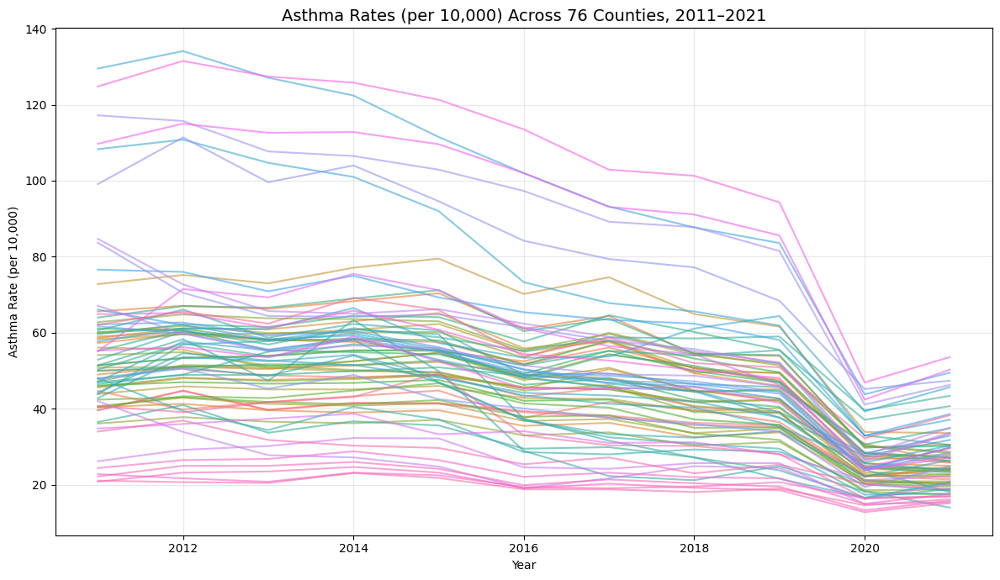

In [ ]:
# line plot of asthma rates (2011–2021) for all counties using unique ID

plt.figure(figsize=(12,7))
sns.lineplot(
    data=complete_panel,
    x="Year",
    y="Asthma Rate",
    hue="CountyFIPS",
    legend=False,
    alpha=0.6
)
plt.title("Asthma Rates (per 10,000) Across 76 Counties, 2011–2021", fontsize=14)
plt.ylabel("Asthma Rate (per 10,000)")
plt.xlabel("Year")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()





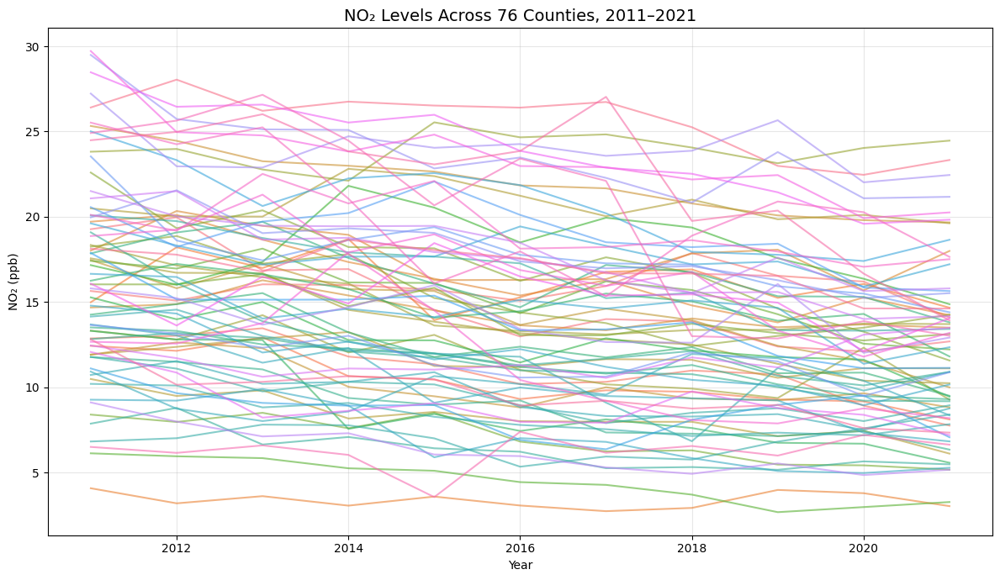

In [ ]:
# line plot of NO₂ levels (2011–2021) for all counties using unique ID

plt.figure(figsize=(12,7))
sns.lineplot(
    data=complete_panel,
    x="Year",
    y="Nitrogen dioxide (NO2)",
    hue="CountyFIPS",
    legend=False,
    alpha=0.6
)
plt.title("NO₂ Levels Across 76 Counties, 2011–2021", fontsize=14)
plt.ylabel("NO₂ (ppb)")
plt.xlabel("Year")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()



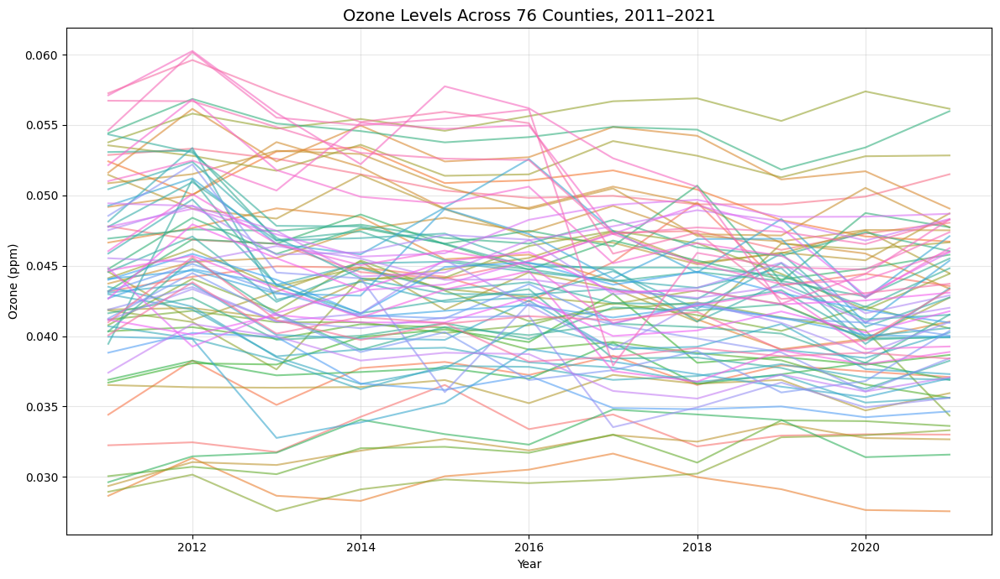

In [ ]:
# line plot of Ozone levels (2011–2021) for all counties using unique ID

plt.figure(figsize=(12,7))
sns.lineplot(
    data=complete_panel,
    x="Year",
    y="Ozone",
    hue="CountyFIPS",
    legend=False,
    alpha=0.6
)
plt.title("Ozone Levels Across 76 Counties, 2011–2021", fontsize=14)
plt.ylabel("Ozone (ppm)")
plt.xlabel("Year")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


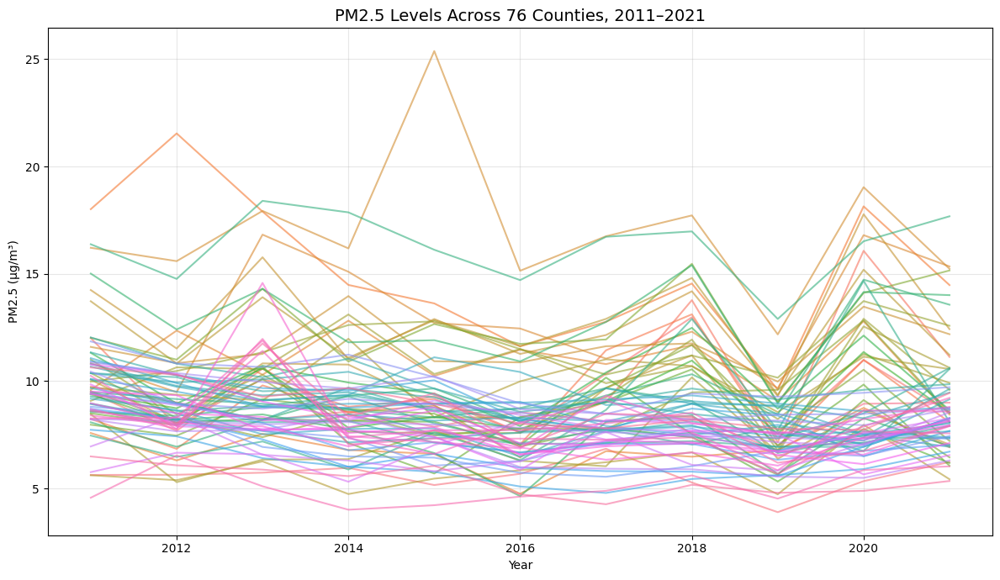

In [ ]:
# line plot of PM2.5 levels (2011–2021) for all counties using unique ID

plt.figure(figsize=(12,7))
sns.lineplot(
    data=complete_panel,
    x="Year",
    y="PM2.5 - Local Conditions",
    hue="CountyFIPS",
    legend=False,
    alpha=0.6
)
plt.title("PM2.5 Levels Across 76 Counties, 2011–2021", fontsize=14)
plt.ylabel("PM2.5 (µg/m³)")
plt.xlabel("Year")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
# find max and min asthma rates in crude asthma dataset

max_rate = asthma_df["Value"].max()
min_rate = asthma_df["Value"].min()

max_row = asthma_df.loc[asthma_df["Value"].idxmax()]
min_row = asthma_df.loc[asthma_df["Value"].idxmin()]

print("Maximum asthma rate:")
print(max_row)
print("\nMinimum asthma rate:")
print(min_row)


Maximum asthma rate:
StateFIPS             36
State           New York
CountyFIPS         36061
County          New York
Year                2012
Value              136.0
Data Comment         NaN
Unnamed: 7           NaN
Name: 11742, dtype: object

Minimum asthma rate:
StateFIPS             31
State           Nebraska
CountyFIPS         31051
County             Dixon
Year                2020
Value                2.1
Data Comment         NaN
Unnamed: 7           NaN
Name: 10112, dtype: object


/tmp/ipython-input-1962777512.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


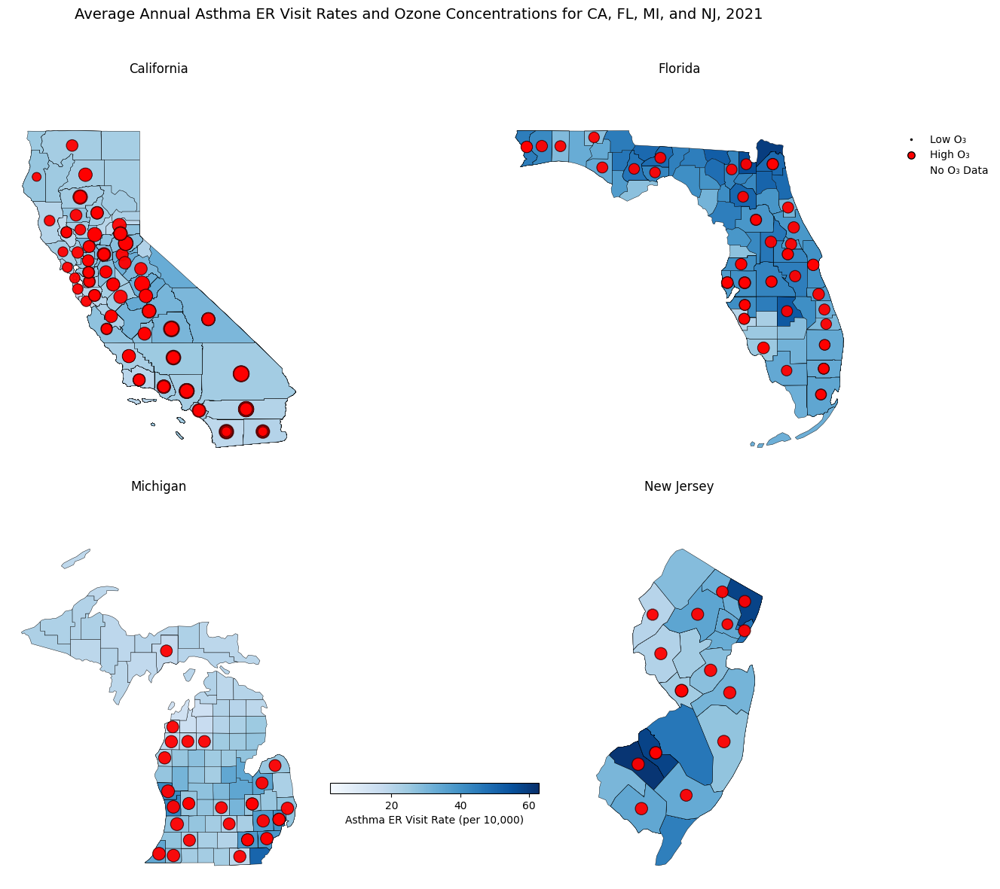

In [ ]:
# Plot 2x2 maps of asthma ER visit rates (blue background, from asthma_df["Value"]) with ozone (red bubbles) for CA, FL, MI, and NJ, 2021

states_to_plot = ["California","Florida","Michigan","New Jersey"]

asthma21 = (
    asthma_df[asthma_df["Year"] == 2021]
    [["CountyFIPS","Value","County","State"]]
    .rename(columns={"Value":"Asthma Rate"})
    .assign(CountyFIPS=lambda d: d["CountyFIPS"].astype(str).str.zfill(5))
)

ozone21 = (
    pollution_df[(pollution_df["Year"] == 2021) & (pollution_df["Parameter Name"]=="Ozone")]
    [["FIPS","Arithmetic Mean"]]
    .rename(columns={"FIPS":"CountyFIPS","Arithmetic Mean":"Ozone"})
    .assign(CountyFIPS=lambda d: d["CountyFIPS"].astype(str).str.zfill(5))
)

state_data = counties.copy()
state_data["FIPS"] = (state_data["STATEFP"] + state_data["COUNTYFP"]).astype(str).str.zfill(5)

merged21 = (
    state_data.merge(asthma21, left_on="FIPS", right_on="CountyFIPS", how="left")
    .merge(ozone21, on="CountyFIPS", how="left")
)

asth_min, asth_max = merged21["Asthma Rate"].min(), merged21["Asthma Rate"].max()
oz_min, oz_max = merged21["Ozone"].min(), merged21["Ozone"].max()

def scale_oz(x):
    return 20 + 400 * (0 if pd.isna(x) or oz_max==oz_min else (x - oz_min)/(oz_max - oz_min))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

for ax, st in zip(axes.flatten(), states_to_plot):
    gdf = merged21[merged21["State"]==st].to_crs(epsg=3857)
    gdf.plot(column="Asthma Rate", cmap="Blues", vmin=asth_min, vmax=asth_max,
             missing_kwds={"color":"lightgray","label":"No Asthma Data"},
             edgecolor="black", linewidth=0.3, ax=ax)
    cent = gdf.geometry.centroid
    mask = gdf["Ozone"].notna()
    ax.scatter(
        cent[mask].x, cent[mask].y,
        s=gdf.loc[mask,"Ozone"].apply(scale_oz),
        c="red", alpha=0.5, edgecolor="black", linewidth=0.4
    )
    ax.set_title(st, fontsize=12, pad=40)
    ax.axis("off")

sm_asth = ScalarMappable(norm=mpl.colors.Normalize(vmin=asth_min, vmax=asth_max), cmap="Blues")
sm_asth.set_array([])
cbar = fig.colorbar(sm_asth, ax=axes.ravel().tolist(), fraction=0.015, pad=0.08, orientation="horizontal")
cbar.set_label("Asthma ER Visit Rate (per 10,000)")

bubble_legend = [
    mlines.Line2D([], [], color="red", marker="o", linestyle="None",
                  markeredgecolor="black", markersize=np.sqrt(scale_oz(oz_min))/3, label="Low O₃"),
    mlines.Line2D([], [], color="red", marker="o", linestyle="None",
                  markeredgecolor="black", markersize=np.sqrt(scale_oz(oz_max))/3, label="High O₃"),
    mlines.Line2D([], [], color="none", marker=None, linestyle="None", label="No O₃ Data")
]
fig.legend(handles=bubble_legend, loc="upper right", bbox_to_anchor=(0.98, 0.85), frameon=False)  # moved legend down

plt.suptitle("Average Annual Asthma ER Visit Rates and Ozone Concentrations for CA, FL, MI, and NJ, 2021", fontsize=14, y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("state_asthma_ozone.png", dpi=300)
plt.show()

